# Value Factor Analysis

This notebook explores the value factor in digital assets, for both time series and cross-sectional strategies.

We will construct various cryptoasset valuation metrics proposed in the literature and compare their performance across a range of statistical tests and financial evaluation criteria.

To conduct this analysis, we will use **FactorLab**, an open-source python package we have created specifically for alpha and risk factor analysis. 

To install **FactorLab**:
`pip install factorlab`

In [1]:
# uncomment to install factorlab
# pip install factorlab

In [4]:
import pandas as pd 
import numpy as np

# from factorlab.feature_engineering.factors.value import Value
# from factorlab.feature_engineering.transformations import Transform
# from factorlab.signal_generation.signal import Signal
# from factorlab.signal_generation.param_grid_search import *
# from factorlab.signal_generation.time_series_analysis import TimeSeriesAnalysis as TSA
# from factorlab.feature_generation.trend import Trend 
# from factorlab.strategy_backtesting.performance import Performance
# from factorlab.data_viz.data_viz import plot_series, plot_bar, plot_table

# Data 

To collect the necessary data for the analysis (perpetual futures, funding rates, spot prices, and aggregate spot prices), we use **CryptoDataPy**, an open source python library that makes it easy to build high quality data pipelines for the analysis of cryptoassets.

It will allow us to pull data from various exchanges and data vendors with ease, clean and stich the data to create the longest possible price and total return series.

To install **CryptoDataPy**:
`pip install cryptodatapy`

In [3]:
# uncomment to install cryptodatapy
# pip install cryptodatapy

## Collect Data

- Funding rates and perptual futures OHLC prices from **Binance** futures exchange (2019-present)
- OHLC spot prices from **Binance** spot exchange (2017-2019)
- OHLC spot prices from **Cryptocompare** (2010-2017)

First, let's pull our value factor data csv files.

Data was gathered, cleaned and wrangled using **CryptoDataPy**, our open source python package. See the data wrangling notebooks for the data pre-processing code.

In [4]:
df = pd.read_csv('../src/factorlab/datasets/data/crypto_market_data.csv', index_col=[0,1], parse_dates=True)
mktcap_df = pd.read_csv('../src/factorlab/datasets/data/crypto_mkt_cap.csv', index_col=[0,1], parse_dates=True)
onchain_df = pd.read_csv('../src/factorlab/datasets/data/crypto_onchain_data.csv', index_col=[0,1], parse_dates=True)

In [5]:
# merge
oc_df = pd.concat([mktcap_df, onchain_df], axis=1).sort_index()

## Compute Value Measures

We create an on-chain dataframe with all our clean on-chain data from which we can create value measures.

- Compute **Market value to Realized value MVRV ratio**

In [6]:
oc_df['mvrv'] = oc_df.mkt_cap / oc_df.mkt_cap_real

- Compute **addresses squared** for new and active addresses, and transaction counts, as per **Metcalfe's law**

In [7]:
# active addresses * mean transf value usd
oc_df['add_act_squared'] = oc_df.add_act ** 2
oc_df['add_new_squared'] = oc_df.add_new ** 2
oc_df['add_tot_squared'] = oc_df.add_tot ** 2
oc_df['tx_count_squared'] = oc_df.tx_count ** 2

- Compute an **adjusted transaction value** to reduce impact of large outlier transactions by multiplying average transfer value by transaction counts

In [8]:
oc_df['tfr_val_usd_adj'] = oc_df.tx_count * oc_df.tfr_val_mean_usd

- Compute **Network value to Transactions value NVT ratio**

In [9]:
oc_df['nvt'] = oc_df.mkt_cap / oc_df.tfr_val_usd
oc_df['nvt_adj'] = oc_df.mkt_cap / oc_df.tfr_val_usd_adj

## Data Exploration

We can now start with some simple exploratory analysis.


Converting our data into logs, we can establish which indicators have the highest correlation with market cap.

In [10]:
# correlations
np.log(oc_df).corr().mkt_cap.sort_values()

nvt_adj            -0.356334
nvt                -0.160856
supply_circ        -0.001201
mvrv                0.182408
tfr_count           0.294565
tfr_val_mean_usd    0.490472
hashrate            0.587205
diff_mean           0.612789
add_act             0.623010
add_act_squared     0.623010
tx_count            0.637112
tx_count_squared    0.637112
add_tot             0.747198
add_tot_squared     0.747198
add_new             0.781988
add_new_squared     0.781988
tfr_val_usd         0.843574
tfr_val_usd_adj     0.876917
mkt_cap_real        0.951861
mkt_cap_ff          0.969022
mkt_cap             1.000000
Name: mkt_cap, dtype: float64

Let's plot our indicators against market cap to get a sense of fit.

#### Aggregate Market Cap vs. On-chain Fundamentals

In [11]:
# plot data
plt_data = oc_df.copy()
plt_data = plt_data[['mkt_cap', 'mkt_cap_real', 'tfr_val_usd', 'tx_count_squared', 'add_act_squared', 'add_new_squared', 'add_tot', 'hashrate', 'diff_mean']].groupby('date').sum()

In [12]:
plot_df = np.log(plt_data[['mkt_cap', 'mkt_cap_real', 'tfr_val_usd', 'tx_count_squared', 'add_act_squared', 'add_new_squared', 'add_tot', 'hashrate', 'diff_mean']])
plot_df.columns = ['market_cap', 'market_cap_realized', 'transfer_value_usd', 'transactions_count', 'active_addresses', 'new_addresses', 'total_addresses', 'hashrate', 'difficulty']

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/internals/blocks.py:352: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


In [13]:
# smooth network data
plot_df.iloc[:,2:] = plot_df.iloc[:,2:].ewm(30).mean()

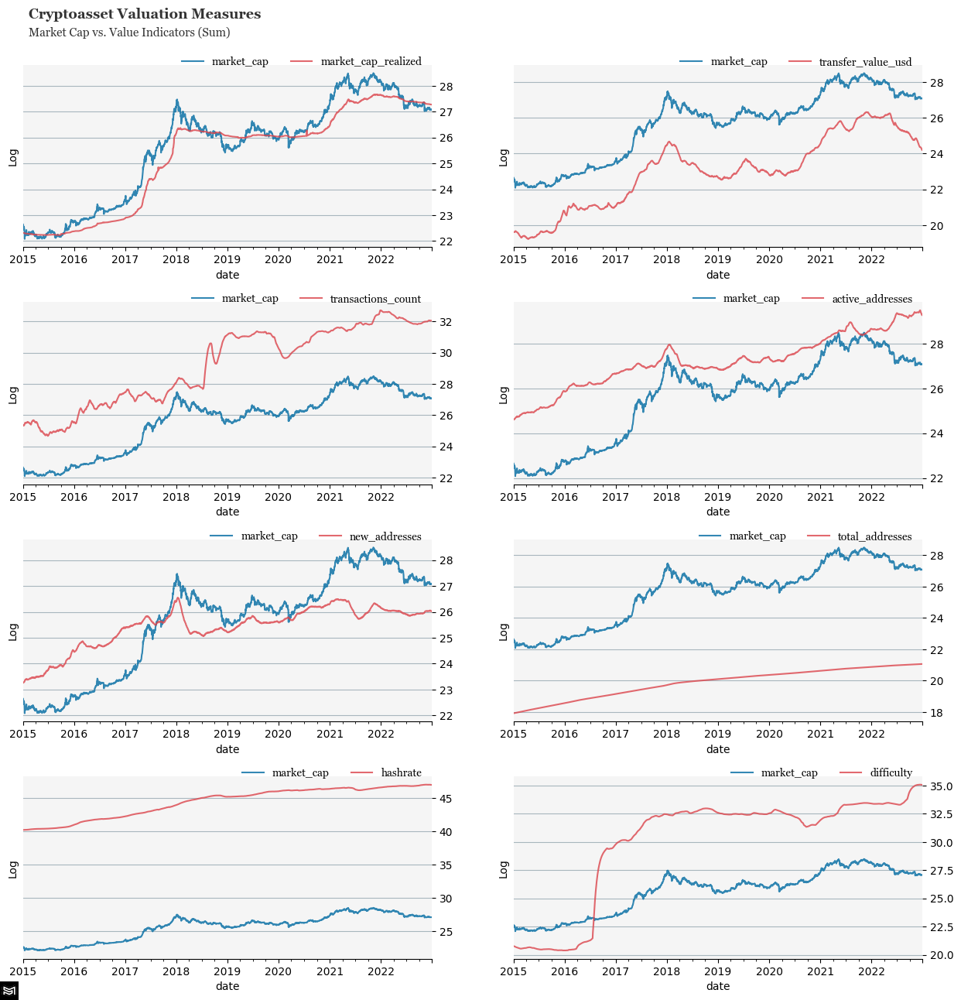

In [14]:
# line plot in Systamental style
# plot size
fig, axes = plt.subplots(figsize=(15, 15), nrows=4, ncols=2)
ax_subplots = ((0,0), (0,1), (1,0), (1,1), (2,0), (2,1), (3,0), (3,1))

# font
plt.rcParams['font.family'] = 'georgia'
# color
colors = ['#006BA2', '#DB444B', '#3EBCD2', '#379A8B', '#EBB434', '#B4BA39', '#9A607F', '#D1B07C', '#758D99']

# plot
for col, axis in zip(plot_df.columns[1:], ax_subplots):
    plot_df.loc['2015-01-01':, ['market_cap', col]].dropna().plot(color=colors, alpha=0.8, ax=axes[axis])
    # grid
    axes[axis].set_axisbelow(True)
    axes[axis].grid(which="major", axis='y', color='#758D99', alpha=0.6)
    axes[axis].set_facecolor("whitesmoke")
    # adjust subplots height space
    plt.subplots_adjust(hspace=0.3)
    #legend   
    axes[axis].legend(bbox_to_anchor=(1, 1.1), loc="upper right", frameon=False, ncol=2)
    # remove splines
    axes[axis].spines[['top', 'right', 'left']].set_visible(False)
    # Reformat y-axis tick labels
    axes[axis].set_ylabel('Log')
    axes[axis].yaxis.tick_right()

# add systamental logo
with resources.path("factorlab", "systamental_logo.png") as f:
    img_path = f
img = Image.open(img_path)
plt.figimage(img, origin='upper')


# Add in title and subtitle
axes[0,0].text(x=0.13, y=.92, s="Cryptoasset Valuation Measures", transform=fig.transFigure, ha='left', fontsize=13,
        weight='bold', alpha=.8, fontdict=None)
axes[0,0].text(x=0.13, y=.905, s="Market Cap vs. Value Indicators (Sum)", transform=fig.transFigure, ha='left', fontsize=11,
        alpha=.8, fontdict=None);


# Feature and Target Variables

## Target Variables

We will need to compute spot, total and forward returns which will be our target variable.

We also compute the equal-weighted and market cap weighted market return to estimate betas/alphas.

In [15]:
# total returns
ret_df = Transform(df.close).returns().rename(columns={'close':'ret'})
ret_df['funding_rate'] = df.funding_rate.fillna(0)
ret_df['tr'] = ret_df.ret - ret_df.funding_rate

In [16]:
# fwd rets
fwd_spot_ret = Transform(df.close).returns(lags=1, forward=True).close.to_frame('fwd_ret_1')
fwd_spot_ret['fwd_ret_5'] = Transform(df.close).returns(lags=5, forward=True)
fwd_spot_ret['fwd_ret_7'] = Transform(df.close).returns(lags=7, forward=True)
fwd_spot_ret['fwd_ret_10'] = Transform(df.close).returns(lags=10, forward=True)
fwd_spot_ret['fwd_ret_14'] = Transform(df.close).returns(lags=14, forward=True)
fwd_spot_ret['fwd_ret_20'] = Transform(df.close).returns(lags=20, forward=True)
fwd_spot_ret['fwd_ret_30'] = Transform(df.close).returns(lags=30, forward=True)
fwd_spot_ret['fwd_ret_60'] = Transform(df.close).returns(lags=60, forward=True)
fwd_spot_ret['fwd_ret_90'] = Transform(df.close).returns(lags=90, forward=True)
fwd_spot_ret['fwd_ret_180'] = Transform(df.close).returns(lags=180, forward=True)
fwd_spot_ret['fwd_ret_365'] = Transform(df.close).returns(lags=365, forward=True)

In [17]:
# normalized fwd spot rets
fwd_spot_ret_z = Transform(fwd_spot_ret).normalize_ts(window_type='expanding')

In [18]:
# relative returns for cross-section 
fwd_rel_ret = fwd_spot_ret.copy()
for col in fwd_rel_ret.columns:
    fwd_rel_ret[col] = fwd_spot_ret[col] - fwd_spot_ret[col].groupby('date').mean()

In [19]:
# normalize relative returns
fwd_rel_ret_z = Transform(fwd_rel_ret).normalize_ts(window_type='expanding')

In [20]:
# create market cap weights and returns
mkt_df = pd.concat([df, mktcap_df], axis=1)
mkt_df['mkt_cap_weights'] = mkt_df.mkt_cap / mkt_df.mkt_cap.groupby('date').sum()
mkt_df['ret'] = Transform(mkt_df.close).returns()

In [21]:
# create ew and mw market returns
mkt_ret_ew = mkt_df.ret.groupby('date').mean().to_frame('mkt_ret')
mkt_ret_mw = (mkt_df.mkt_cap_weights * mkt_df.ret).groupby('date').sum().to_frame('mkt_ret')

In [22]:
# mkt autocorrelations
mkt_ret_mw.mkt_ret.autocorr()

-0.0965125822552799

In [23]:
mkt_ret_ew.mkt_ret.autocorr()

-0.08242550544737562

## Value Factors

We compute all value factors referenced in any of the literature in order to compare their statistical and predictive properties. All value factors are normalized (z-score) using an expanding window over the time series to account for differences across blockchains (e.g. some blockchains may have significantly higher network activity than others which makes ratio comparisons across assets difficult and potentially meaningless). 

Our value factor horserace will include the following value factors:

1. **Network value to transactions (NVT)**: the network value to transactions ratio is similar to the PE ratio in equity markets. It measures the  value being transmitted on-chain, i.e. the value of the activity on the network. A high NVT ratio indicates high network value relative to network activity/volume, whereas a low NVT ratio points to a low network value relative to network activity/volume. Note that NVT is the inverse of token velocity.
2. **Network value to Metcalfe (NVM)**: Metcalfe's law models a network's value as the square of the number of network users. The network value to Metcalfe ratio is the ratio of network value (or market cap) to the value estimated by Metcalfe law. Deviations from estimated value represent over/undervaluation.
3. **Network value to Stocks-to-flow (NVSF)**: the Stocks-to-Flow ratio measures the issuance ratio of a cryptoasset. The scarcer the asset, the more valuable it is as a store of value. Deviations of the network's value relative to the Stocks-to-Flow ratio represent over/undervaluation.
4. **Network value to Cost of production (NVC)**: the cost of production is often estimated using variables like electricity prices, mining efficiency and difficulty, the issuance rate, and other proxies like hashrate and difficulty. Deviations of the network's value relative to the cost of production represent over/undervaluation.
5. **Market value to realized value (MVRV)**: realized value represents the cost basis of supply. Market prices tend to fluctuate around the cost basis. Extreme deviations between market value and realized value reflect periods of extreme unrealized gains/losses for investors.
6. **Negative long-term price momentum (NPM)**: the negative of long-term price momentum is generic value factor often used in the literature for non-cash flow assets (e.g. commodities, FX, etc). It has been shown to generate portfolios that are highly correlated with those formed with fundamental value characteristics. In addition, prices tend to be mean reverting over long-term time frames which makes them a simple benchmark to compare fundamental value factors against.

**FactorLab** has a `Value` class with various methods like `nvt` and `nvm` which facilitates the construction of all of the value measures shown above. 

In [24]:
value_df =  Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvt()
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvt())
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvt(value_metric='tfr_val_usd_adj', name='nvt_adj'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvt(value_metric='tfr_val_usd_adj', name='nvt_adj'))
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvt(value_metric='tx_count', name='nvt_count'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvt(value_metric='tx_count', name='nvt_count'))
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_act', name='nvm_add_act'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_act', name='nvm_add_act'))
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_new', name='nvm_add_new'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_new', name='nvm_add_new'))
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_tot', name='nvm_add_tot'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvm(value_metric='add_tot', name='nvm_add_to'))
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvsf())
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvsf())
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvc(value_metric='hashrate', name='nvc_hashrate'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvc(value_metric='hashrate', name='nvc_hashrate'))             
value_df =  value_df.join(Value(oc_df, method='ratio', smoothing='ewm', sm_window_size=30).nvc(value_metric='diff_mean', name='nvc_diff_mean'))
value_df =  value_df.join(Value(oc_df, method='resid', smoothing='ewm', sm_window_size=30).nvc(value_metric='diff_mean', name='nvc_diff_mean'))
value_df = value_df.join(Value(oc_df).npm(price='mkt_cap', lookback=180))
value_df = value_df.join(Value(oc_df).npm(price='mkt_cap', lookback=365))
value_df = value_df.join(Value(oc_df).npm(price='mkt_cap', lookback=700))
value_df = value_df.join(Value(oc_df).npm(price='mkt_cap', lookback=1050))
value_df['mvrv'] = oc_df.mvrv * -1

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

In [25]:
value_df.columns

Index(['nvt_ratio_ewm_30', 'nvt_resid_ewm_30', 'nvt_adj_ratio_ewm_30',
       'nvt_adj_resid_ewm_30', 'nvt_count_ratio_ewm_30',
       'nvt_count_resid_ewm_30', 'nvm_add_act_ratio_ewm_30',
       'nvm_add_act_resid_ewm_30', 'nvm_add_new_ratio_ewm_30',
       'nvm_add_new_resid_ewm_30', 'nvm_add_tot_ratio_ewm_30',
       'nvm_add_to_resid_ewm_30', 'nvsf_ratio_ewm_30', 'nvsf_resid_ewm_30',
       'nvc_hashrate_ratio_ewm_30', 'nvc_hashrate_resid_ewm_30',
       'nvc_diff_mean_ratio_ewm_30', 'nvc_diff_mean_resid_ewm_30', 'mvrv',
       'npm_180', 'npm_365', 'npm_700', 'npm_1050'],
      dtype='object')

In [26]:
value_z_df = Transform(value_df).normalize_ts(window_type='expanding')

### Value factor correlations

In [27]:
value_z_df.corr()

,mvrv,npm_1050,npm_180,npm_365,npm_700,nvc_diff_mean_ratio_ewm_30,nvc_diff_mean_resid_ewm_30,nvc_hashrate_ratio_ewm_30,nvc_hashrate_resid_ewm_30,nvm_add_act_ratio_ewm_30,...,nvm_add_to_resid_ewm_30,nvm_add_tot_ratio_ewm_30,nvsf_ratio_ewm_30,nvsf_resid_ewm_30,nvt_adj_ratio_ewm_30,nvt_adj_resid_ewm_30,nvt_count_ratio_ewm_30,nvt_count_resid_ewm_30,nvt_ratio_ewm_30,nvt_resid_ewm_30
mvrv,1.000000,0.464685,0.551230,0.583373,0.526976,0.138877,0.609477,0.057950,0.625266,-0.049027,...,0.674097,0.562631,-0.075064,0.590538,-0.208751,0.389219,0.056624,0.455204,-0.271177,0.426956
npm_1050,0.464685,1.000000,0.380621,0.514820,0.608885,0.275038,0.448684,0.013590,0.460062,0.104220,...,0.495641,0.395238,-0.058884,0.394075,-0.043007,0.491420,0.161887,0.429885,-0.092601,0.529807
npm_180,0.551230,0.380621,1.000000,0.753925,0.566815,0.136700,0.671938,0.131414,0.666037,-0.276730,...,0.701114,0.407386,-0.024780,0.590471,-0.252443,0.424585,-0.012254,0.514688,-0.397585,0.420911
npm_365,0.583373,0.514820,0.753925,1.000000,0.673465,0.177158,0.674186,0.128921,0.651247,-0.199373,...,0.759621,0.485005,-0.043356,0.611661,-0.230172,0.491969,0.060003,0.566129,-0.379843,0.505565
npm_700,0.526976,0.608885,0.566815,0.673465,1.000000,0.337342,0.621180,-0.001160,0.524977,-0.020723,...,0.639571,0.463043,-0.031301,0.499988,-0.191467,0.497598,0.176799,0.580364,-0.266657,0.527994
nvc_diff_mean_ratio_ewm_30,0.138877,0.275038,0.136700,0.177158,0.337342,1.000000,0.535583,0.494348,0.544742,0.011037,...,NaN,NaN,-0.380844,0.168490,0.035375,0.334853,0.213700,0.339042,0.007998,0.295484
nvc_diff_mean_resid_ewm_30,0.609477,0.448684,0.671938,0.674186,0.621180,0.535583,1.000000,0.267667,0.996518,0.402868,...,NaN,NaN,-0.471211,0.607992,-0.171602,0.530750,0.394586,0.755426,-0.194151,0.436737
nvc_hashrate_ratio_ewm_30,0.057950,0.013590,0.131414,0.128921,-0.001160,0.494348,0.267667,1.000000,0.376235,-0.205647,...,0.493826,0.251394,-0.129673,0.278024,-0.182407,0.116987,-0.207801,0.171460,-0.212767,0.095664
nvc_hashrate_resid_ewm_30,0.625266,0.460062,0.666037,0.651247,0.524977,0.544742,0.996518,0.376235,1.000000,0.298888,...,0.789579,0.460977,-0.385146,0.656826,-0.187319,0.428489,0.295659,0.660951,-0.207894,0.357182
nvm_add_act_ratio_ewm_30,-0.049027,0.104220,-0.276730,-0.199373,-0.020723,0.011037,0.402868,-0.205647,0.298888,1.000000,...,-0.246746,-0.044193,-0.134704,-0.135411,0.246850,0.084645,0.575738,0.253176,0.537982,0.003295


# Statistical Analysis

In our statistical analysis, we'll explore the relationship between our value measures and price/forward returns.

This will include:

1. *Stationarity tests*
2. *Granger Causality tests*
2. *Screening methods*
4. *Regression Analysis*


### Stationarity Tests

Stationarity tests allow us to assess the strength of convergence/mean reversion of the time series. This is especially important for a value strategy which is an implicit bet on prices mean reverting to estimated fundamental values.

To assess the stationarity and mean-reversion properties of our value factors, we run both an ADF test and compute the Hurst exponents.

#### Augmented Dickey-Fuller (ADF) Test

The ADF test looks for the presence of a unit root in an autoregressive time series sample. 

https://en.wikipedia.org/wiki/Augmented_Dickey%E2%80%93Fuller_test

Since our data set includes over 100 assets, rather than testing stationarity for each one, we compute the aggregate sum for each metric (e.g. total market cap, total realized market cap, transfer value in usd, active addresses, etc) and a run a regression (log) to estimate the residuals for each value measure.

Alternatively, one can run each stationarity test individually and average the results. The results should be robust to either approach.

We use `linear_reg` function in **FactorLab** to run the regressions for the ADF tests.

In [28]:
oc_agg_df = oc_df.groupby('date').sum()

In [29]:
resid = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.mkt_cap_real, window_type='expanding', output='resid', log=True,
                                   trend='c').resid.to_frame('mkt_cap_real')
resid['tfr_val_usd'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.tfr_val_usd, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['tfr_val_mean_usd'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.tfr_val_mean_usd, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['tfr_val_usd_adj'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.tfr_val_usd_adj, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['tx_count'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.tx_count, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['add_act'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.add_act, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['add_new'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.add_new, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['add_tot'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.add_tot, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['hashrate'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.hashrate, window_type='expanding', output='resid', log=True,
                                   trend='c')
resid['diff_mean'] = linear_reg(oc_agg_df.mkt_cap, oc_agg_df.diff_mean, window_type='expanding', output='resid', log=True,
                                   trend='c')

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/arraylike.py:405: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/internals/blocks.py:352: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/arraylike.py:405: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/internals/blocks.py:352: RuntimeWarning: divide by zero encountered in log
  result 

In [30]:
adf(resid)

,adf,p-val,lags,nobs,1%,5%,10%
tfr_val_mean_usd,-5.0318,0.0000,28,4521,-3.4318,-2.8622,-2.5671
tfr_val_usd_adj,-4.1446,0.0008,32,4517,-3.4318,-2.8622,-2.5671
tfr_val_usd,-3.6911,0.0042,28,4521,-3.4318,-2.8622,-2.5671
tx_count,-3.6193,0.0054,29,4520,-3.4318,-2.8622,-2.5671
mkt_cap_real,-3.2561,0.0170,8,4541,-3.4318,-2.8622,-2.5671
diff_mean,-3.1994,0.0200,20,4529,-3.4318,-2.8622,-2.5671
add_act,-2.7992,0.0584,30,4519,-3.4318,-2.8622,-2.5671
add_tot,-2.6915,0.0755,23,4526,-3.4318,-2.8622,-2.5671
add_new,-2.3276,0.1632,30,4519,-3.4318,-2.8622,-2.5671
hashrate,-1.9751,0.2976,6,4543,-3.4318,-2.8622,-2.5671


#### Hurst Exponent

The goal of the Hurst Exponent is to provide us with a scalar value that will help us to identify (within the limits of statistical estimation) whether a series it mean reverting, random walking or trending.

The idea behind the Hurst Exponent calculation is that we can use the variance of a log price series to assess the rate of diffusive behaviour. For an arbitrary time lag $\tau$, the variance of $\tau$ is given by:

Var($\tau$) = <|log(t + $\tau$) - log(t)|<sup>2</sup>> ~ $\tau$<sup>2</sup>

- H < 0.5 - The time series is mean reverting
- H = 0.5 - The time series is a Geometric Brownian Motion
- H > 0.5 - The time series is trending

A value of H near 0 is highly mean reverting series whereas a H near 1 indicates a strongly trending series.

https://en.wikipedia.org/wiki/Hurst_exponent

The `hurst` function in **FactorLab** computes Hurst exponents for us. We use the default 365 day lookback window.

In [31]:
hurst(resid, window_size=365)

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/time_series_analysis.py:510: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res_df = res_df.append(hurst_exp, ignore_index=True)
/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/time_series_analysis.py:510: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res_df = res_df.append(hurst_exp, ignore_index=True)
/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/time_series_analysis.py:510: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  res_df = res_df.append(hurst_exp, ignore_index=True)
/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/time_series_analysis.py:510: FutureWarning: The f

,hurst
tfr_val_usd_adj,0.153359
tfr_val_mean_usd,0.170562
tfr_val_usd,0.181551
add_new,0.336095
add_act,0.346697
tx_count,0.379293
mkt_cap_real,0.424265
hashrate,0.503173
add_tot,0.522374
diff_mean,0.523988


### Granger Causality Tests

Granger causality tests are often used to assess whether a time series is useful for predicting another. We can use this tests to determine the relationship between features and target, and rank features based on the test statistic (sum of squared residuals F-test).

The `granger_causality` function in **FactorLab** runs granger causality tests and outputs an F-test.

In [32]:
gc_test = granger_causality(np.log(oc_agg_df.mkt_cap).diff(), np.log(oc_agg_df).diff())

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/arraylike.py:405: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/pandas/core/internals/blocks.py:352: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)



Granger Causality
number of lags (no zero) 1
ssr based F test:         F=-0.0000 , p=1.0000  , df_denom=4547, df_num=1
ssr based chi2 test:   chi2=-0.0000 , p=1.0000  , df=1
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=1
parameter F test:         F=0.5653  , p=0.4522  , df_denom=4547, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=4545, df_num=2
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=2
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=2
parameter F test:         F=1.0570  , p=0.3476  , df_denom=4545, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.0000  , p=1.0000  , df_denom=4543, df_num=3
ssr based chi2 test:   chi2=0.0000  , p=1.0000  , df=3
likelihood ratio test: chi2=-0.0000 , p=1.0000  , df=3
parameter F test:         F=0.9519  , p=0.4145  , df_denom=4543, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=-0.0000 , p=1.

ssr based F test:         F=0.5185  , p=0.4715  , df_denom=4546, df_num=1
ssr based chi2 test:   chi2=0.5189  , p=0.4713  , df=1
likelihood ratio test: chi2=0.5188  , p=0.4713  , df=1
parameter F test:         F=0.5185  , p=0.4715  , df_denom=4546, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.3435  , p=0.7093  , df_denom=4543, df_num=2
ssr based chi2 test:   chi2=0.6877  , p=0.7090  , df=2
likelihood ratio test: chi2=0.6877  , p=0.7090  , df=2
parameter F test:         F=0.3435  , p=0.7093  , df_denom=4543, df_num=2

Granger Causality
number of lags (no zero) 3
ssr based F test:         F=0.2509  , p=0.8608  , df_denom=4540, df_num=3
ssr based chi2 test:   chi2=0.7537  , p=0.8605  , df=3
likelihood ratio test: chi2=0.7537  , p=0.8605  , df=3
parameter F test:         F=0.2509  , p=0.8608  , df_denom=4540, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.2788  , p=0.0585  , df_denom=4537, df_num=4
ssr based chi2

ssr based F test:         F=1.4530  , p=0.1904  , df_denom=4531, df_num=6
ssr based chi2 test:   chi2=8.7428  , p=0.1886  , df=6
likelihood ratio test: chi2=8.7344  , p=0.1891  , df=6
parameter F test:         F=1.4530  , p=0.1904  , df_denom=4531, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=1.3247  , p=0.2339  , df_denom=4528, df_num=7
ssr based chi2 test:   chi2=9.3038  , p=0.2316  , df=7
likelihood ratio test: chi2=9.2943  , p=0.2322  , df=7
parameter F test:         F=1.3247  , p=0.2339  , df_denom=4528, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.2479  , p=0.2665  , df_denom=4525, df_num=8
ssr based chi2 test:   chi2=10.0210 , p=0.2636  , df=8
likelihood ratio test: chi2=10.0100 , p=0.2643  , df=8
parameter F test:         F=1.2479  , p=0.2665  , df_denom=4525, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=1.6578  , p=0.1980  , df_denom=4546, df_num=1
ssr based chi2

parameter F test:         F=1.6569  , p=0.1741  , df_denom=4540, df_num=3

Granger Causality
number of lags (no zero) 4
ssr based F test:         F=2.8240  , p=0.0235  , df_denom=4537, df_num=4
ssr based chi2 test:   chi2=11.3184 , p=0.0232  , df=4
likelihood ratio test: chi2=11.3043 , p=0.0233  , df=4
parameter F test:         F=2.8240  , p=0.0235  , df_denom=4537, df_num=4

Granger Causality
number of lags (no zero) 5
ssr based F test:         F=2.0115  , p=0.0738  , df_denom=4534, df_num=5
ssr based chi2 test:   chi2=10.0820 , p=0.0729  , df=5
likelihood ratio test: chi2=10.0708 , p=0.0733  , df=5
parameter F test:         F=2.0115  , p=0.0738  , df_denom=4534, df_num=5

Granger Causality
number of lags (no zero) 6
ssr based F test:         F=1.7844  , p=0.0982  , df_denom=4531, df_num=6
ssr based chi2 test:   chi2=10.7371 , p=0.0968  , df=6
likelihood ratio test: chi2=10.7244 , p=0.0973  , df=6
parameter F test:         F=1.7844  , p=0.0982  , df_denom=4531, df_num=6

Granger Causa

ssr based F test:         F=0.9224  , p=0.4774  , df_denom=4531, df_num=6
ssr based chi2 test:   chi2=5.5501  , p=0.4754  , df=6
likelihood ratio test: chi2=5.5467  , p=0.4758  , df=6
parameter F test:         F=0.9224  , p=0.4774  , df_denom=4531, df_num=6

Granger Causality
number of lags (no zero) 7
ssr based F test:         F=0.9340  , p=0.4787  , df_denom=4528, df_num=7
ssr based chi2 test:   chi2=6.5595  , p=0.4761  , df=7
likelihood ratio test: chi2=6.5548  , p=0.4767  , df=7
parameter F test:         F=0.9340  , p=0.4787  , df_denom=4528, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=1.1264  , p=0.3416  , df_denom=4525, df_num=8
ssr based chi2 test:   chi2=9.0450  , p=0.3385  , df=8
likelihood ratio test: chi2=9.0360  , p=0.3393  , df=8
parameter F test:         F=1.1264  , p=0.3416  , df_denom=4525, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=18.2225 , p=0.0000  , df_denom=4546, df_num=1
ssr based chi2

ssr based F test:         F=0.9141  , p=0.4941  , df_denom=4528, df_num=7
ssr based chi2 test:   chi2=6.4200  , p=0.4917  , df=7
likelihood ratio test: chi2=6.4155  , p=0.4922  , df=7
parameter F test:         F=0.9141  , p=0.4941  , df_denom=4528, df_num=7

Granger Causality
number of lags (no zero) 8
ssr based F test:         F=0.8558  , p=0.5534  , df_denom=4525, df_num=8
ssr based chi2 test:   chi2=6.8721  , p=0.5505  , df=8
likelihood ratio test: chi2=6.8669  , p=0.5511  , df=8
parameter F test:         F=0.8558  , p=0.5534  , df_denom=4525, df_num=8

Granger Causality
number of lags (no zero) 1
ssr based F test:         F=0.7322  , p=0.3922  , df_denom=4546, df_num=1
ssr based chi2 test:   chi2=0.7327  , p=0.3920  , df=1
likelihood ratio test: chi2=0.7326  , p=0.3920  , df=1
parameter F test:         F=0.7322  , p=0.3922  , df_denom=4546, df_num=1

Granger Causality
number of lags (no zero) 2
ssr based F test:         F=0.4872  , p=0.6144  , df_denom=4543, df_num=2
ssr based chi2

In [33]:
gc_test

,ssr_ftest,p-val
mkt_cap_real,4.4406,0.0000
add_tot_squared,4.3875,0.0000
tfr_count,2.6227,0.0073
hashrate,2.4664,0.0115
add_tot,2.3191,0.0176
tfr_val_usd,1.8216,0.0683
tfr_val_mean_usd,1.3381,0.2193
add_act,1.2479,0.2665
add_new,1.2212,0.2818
mkt_cap_ff,1.1689,0.3138


### Filter Methods

Filter-based methods are a category of supervised feature selection technique that are independent from the ML algorithm and can be used to evaluate the relationship between features (value measures) and the target variable (forward returns), and rank the features based on the strength of their statistical relationship with the target.

The `Factor` class has a `filter` method which allows us to run a filter on our value measures and forward returns. Standardized value measures are first discretized into quantiles/bins and ranked by the selected statistical measure. Here we used Spearman correlation.

#### Time series

In [34]:
# compute stats for time series strategies
stats_ts_1d_df = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_1, strategy='ts_ls', factor_bins=3, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [35]:
stats_ts_1d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_new_ratio_ewm_30,0.02,0.00,0.03,106.98,0.01,1.00
nvm_add_act_ratio_ewm_30,0.02,0.00,0.02,61.66,0.00,1.00
nvt_count_ratio_ewm_30,0.01,0.01,0.02,29.23,0.01,1.00
nvm_add_new_resid_ewm_30,0.01,0.01,0.05,212.59,0.00,1.00
nvt_adj_resid_ewm_30,0.01,0.05,0.03,85.81,0.00,1.00
nvt_resid_ewm_30,0.01,0.03,0.03,137.36,0.00,1.00
npm_1050,0.01,0.17,0.04,139.93,0.00,0.99
nvm_add_act_resid_ewm_30,0.01,0.05,0.04,278.19,0.00,1.00
nvm_add_tot_ratio_ewm_30,0.01,0.13,0.06,364.10,0.00,1.00
npm_180,0.00,0.27,0.03,153.66,0.00,0.99


In [36]:
# compute stats for time series strategies
stats_ts_7d_df = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_7, strategy='ts_ls', factor_bins=3, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [37]:
stats_ts_7d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_new_ratio_ewm_30,0.06,0.00,0.05,278.15,0.00,1.00
nvm_add_act_ratio_ewm_30,0.05,0.00,0.04,208.75,0.01,1.00
nvm_add_new_resid_ewm_30,0.04,0.00,0.05,248.57,0.00,1.00
nvt_count_ratio_ewm_30,0.03,0.00,0.03,66.70,0.00,1.00
nvt_adj_resid_ewm_30,0.02,0.00,0.03,93.17,0.01,1.00
nvm_add_tot_ratio_ewm_30,0.02,0.00,0.05,317.25,0.01,1.00
nvsf_ratio_ewm_30,0.02,0.00,0.02,70.02,0.00,1.00
nvt_count_resid_ewm_30,0.02,0.00,0.05,208.52,0.01,1.00
nvm_add_act_resid_ewm_30,0.01,0.00,0.04,296.85,0.01,1.00
npm_1050,0.01,0.01,0.05,163.67,0.00,0.99


In [38]:
# compute stats for time series strategies
stats_ts_30d_df = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_30, strategy='ts_ls', factor_bins=3, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [39]:
stats_ts_30d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_new_resid_ewm_30,0.11,0.00,0.08,666.97,0.01,1.00
nvm_add_new_ratio_ewm_30,0.10,0.00,0.09,876.22,0.01,1.00
nvm_add_act_ratio_ewm_30,0.09,0.00,0.07,772.86,0.01,1.00
nvt_adj_resid_ewm_30,0.06,0.00,0.05,250.81,0.01,1.00
nvm_add_act_resid_ewm_30,0.06,0.00,0.06,528.33,0.01,1.00
nvm_add_tot_ratio_ewm_30,0.06,0.00,0.08,613.25,0.01,1.00
nvt_resid_ewm_30,0.06,0.00,0.06,520.81,0.00,1.00
nvt_count_ratio_ewm_30,0.05,0.00,0.05,194.83,0.00,1.00
npm_1050,0.05,0.00,0.07,350.63,0.00,0.99
nvt_count_resid_ewm_30,0.05,0.00,0.05,253.45,0.00,1.00


In [40]:
# compute stats for time series strategies
stats_ts_90d_df = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_90, strategy='ts_ls', factor_bins=3, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [41]:
stats_ts_90d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_new_ratio_ewm_30,0.15,0.00,0.13,1619.12,0.02,1.00
nvm_add_new_resid_ewm_30,0.14,0.00,0.11,1117.59,0.01,1.00
nvm_add_act_ratio_ewm_30,0.14,0.00,0.10,1567.62,0.02,1.00
npm_1050,0.13,0.00,0.11,787.14,0.01,0.99
nvm_add_act_resid_ewm_30,0.11,0.00,0.09,1078.65,0.01,1.00
nvt_resid_ewm_30,0.10,0.00,0.08,1038.66,0.01,1.00
nvt_adj_resid_ewm_30,0.09,0.00,0.08,502.35,0.01,1.00
nvm_add_tot_ratio_ewm_30,0.08,0.00,0.08,698.87,0.01,1.00
nvt_count_resid_ewm_30,0.08,0.00,0.06,303.01,0.00,1.00
nvt_count_ratio_ewm_30,0.07,0.00,0.05,237.62,0.01,1.00


#### Cross sectional

In [42]:
# compute stats for cross sectional strategies
stats_cs_1d_df = Factor(value_z_df, fwd_rel_ret_z.fwd_ret_1, strategy='cs_ls', factor_bins=5, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [43]:
stats_cs_1d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
npm_180,0.03,0.00,0.04,504.14,0.01,0.99
npm_365,0.02,0.00,0.02,145.42,0.00,0.99
npm_700,0.01,0.00,0.03,158.69,0.00,0.99
nvsf_resid_ewm_30,0.01,0.00,0.04,389.35,0.00,1.00
nvm_add_act_resid_ewm_30,0.01,0.00,0.02,82.91,0.00,1.00
npm_1050,0.01,0.01,0.04,236.65,0.00,0.99
nvt_resid_ewm_30,0.01,0.00,0.01,45.18,0.00,1.00
nvm_add_new_resid_ewm_30,0.01,0.03,0.02,96.12,0.00,1.00
nvm_add_tot_ratio_ewm_30,0.01,0.04,0.03,155.38,0.00,1.00
nvc_hashrate_resid_ewm_30,0.01,0.43,0.03,76.63,0.00,1.00


In [44]:
# compute stats for cross sectional strategies
stats_cs_7d_df = Factor(value_z_df, fwd_rel_ret_z.fwd_ret_7, strategy='cs_ls', factor_bins=5, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [45]:
stats_cs_7d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_act_resid_ewm_30,0.04,0.00,0.03,238.59,0.00,1.00
nvm_add_new_resid_ewm_30,0.03,0.00,0.03,128.58,0.01,1.00
npm_180,0.03,0.00,0.04,555.09,0.01,0.99
nvsf_resid_ewm_30,0.03,0.00,0.04,439.51,0.01,1.00
nvt_resid_ewm_30,0.02,0.00,0.02,113.39,0.00,1.00
nvt_count_resid_ewm_30,0.02,0.00,0.03,156.59,0.00,1.00
npm_700,0.02,0.00,0.04,259.77,0.00,0.99
npm_1050,0.02,0.00,0.04,234.65,0.01,0.99
nvt_adj_resid_ewm_30,0.02,0.00,0.02,82.38,0.00,1.00
npm_365,0.02,0.00,0.03,192.03,0.00,0.99


In [46]:
# compute stats for cross sectional strategies
stats_cs_30d_df = Factor(value_z_df, fwd_rel_ret_z.fwd_ret_30, strategy='cs_ls', factor_bins=5, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [47]:
stats_cs_30d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_act_resid_ewm_30,0.08,0.00,0.05,751.12,0.00,1.00
nvsf_resid_ewm_30,0.08,0.00,0.06,887.21,0.01,1.00
nvt_count_resid_ewm_30,0.06,0.00,0.05,429.04,0.00,1.00
nvm_add_new_resid_ewm_30,0.06,0.00,0.04,386.22,0.00,1.00
nvt_resid_ewm_30,0.06,0.00,0.04,411.53,0.00,1.00
npm_1050,0.04,0.00,0.05,329.58,0.00,0.99
npm_180,0.04,0.00,0.06,927.38,0.01,0.99
npm_700,0.04,0.00,0.04,368.43,0.00,0.99
npm_365,0.04,0.00,0.04,448.42,0.00,0.99
nvt_adj_resid_ewm_30,0.04,0.00,0.04,229.75,0.00,1.00


In [48]:
# compute stats for cross sectional strategies
stats_cs_90d_df = Factor(value_z_df, fwd_rel_ret_z.fwd_ret_90, strategy='cs_ls', factor_bins=5, ret_bins=3).filter(metrics=['spearman_r', 'p-val', 'cramer_v', 'chi2', 'mutual_info', 'autocorrelation'], rank_on='spearman_r')

In [49]:
stats_cs_90d_df

,spearman_r,p-val,cramer_v,chi2,mutual_info,autocorrelation
nvm_add_act_resid_ewm_30,0.14,0.00,0.08,1721.06,0.01,1.00
nvsf_resid_ewm_30,0.14,0.00,0.09,1922.82,0.02,1.00
nvt_resid_ewm_30,0.10,0.00,0.06,1244.12,0.01,1.00
nvm_add_new_resid_ewm_30,0.10,0.00,0.07,941.14,0.02,1.00
nvt_count_resid_ewm_30,0.10,0.00,0.06,590.30,0.01,1.00
npm_700,0.07,0.00,0.07,886.74,0.01,0.99
npm_365,0.07,0.00,0.06,939.11,0.01,0.99
nvc_hashrate_ratio_ewm_30,0.07,0.00,0.09,711.52,0.03,1.00
npm_1050,0.07,0.00,0.08,806.01,0.01,0.99
nvc_hashrate_resid_ewm_30,0.07,0.00,0.06,274.52,0.01,1.00


### Regression Analysis

We can use the **FactorLab** `regression` method in the `Factor` class to run *pooled* and *Fama-Macbeth* regressions in order to assess the economic and statistical significance of our value measures for both time series and cross sectional implementations. Regressions use a robust estimator (Newey-West) to account for heteroskedasticity and autocorrelation.

Value measures are ranked by betas to forward returns. We use 1, 7, 30 and 90 day forward return windows. Both value measures and forward returns are normalized (z-score).

#### Pooled regression

In [50]:
reg_1d_pooled = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_1).regression(method='pooled')

In [51]:
reg_1d_pooled

,beta,pval,rsq
nvm_add_new_ratio_ewm_30,0.014478,0.000004,0.000524
nvm_add_act_ratio_ewm_30,0.010883,0.000003,0.00033
nvm_add_new_resid_ewm_30,0.008578,0.00254,0.000236
npm_1050,0.006994,0.088135,0.000107
nvt_count_ratio_ewm_30,0.006885,0.02001,0.00012
nvt_adj_ratio_ewm_30,0.006682,0.080913,0.000078
nvt_ratio_ewm_30,0.005818,0.023885,0.000072
nvc_hashrate_ratio_ewm_30,0.005344,0.425004,0.000034
nvm_add_tot_ratio_ewm_30,0.004259,0.252808,0.000032
nvm_add_act_resid_ewm_30,0.003479,0.136876,0.000039


In [52]:
reg_7d_pooled = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_7).regression(method='pooled')

In [53]:
reg_7d_pooled

,beta,pval,rsq
nvm_add_new_ratio_ewm_30,0.038774,0.0,0.003377
nvm_add_new_resid_ewm_30,0.02744,0.0,0.002158
nvm_add_act_ratio_ewm_30,0.027024,0.0,0.001755
nvc_hashrate_ratio_ewm_30,0.024487,0.001401,0.00057
npm_1050,0.020491,0.000004,0.000791
nvt_count_ratio_ewm_30,0.014752,0.000013,0.000446
nvt_ratio_ewm_30,0.014237,0.0,0.00037
nvm_add_tot_ratio_ewm_30,0.012411,0.001665,0.000242
nvm_add_act_resid_ewm_30,0.012363,0.000001,0.000427
nvt_adj_ratio_ewm_30,0.012123,0.007132,0.000208


In [54]:
reg_30d_pooled = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_30).regression(method='pooled')

In [55]:
reg_30d_pooled

,beta,pval,rsq
nvm_add_new_resid_ewm_30,0.063663,0.0,0.010979
nvm_add_new_ratio_ewm_30,0.061434,0.0,0.00813
npm_1050,0.051861,0.0,0.005116
nvc_hashrate_ratio_ewm_30,0.047224,0.0,0.001959
nvm_add_act_ratio_ewm_30,0.045998,0.0,0.004731
nvm_add_tot_ratio_ewm_30,0.041862,0.0,0.00264
nvm_add_act_resid_ewm_30,0.038676,0.0,0.003865
nvt_resid_ewm_30,0.035485,0.0,0.002796
nvt_adj_resid_ewm_30,0.031335,0.0,0.001902
nvc_diff_mean_ratio_ewm_30,0.027051,0.005231,0.000889


In [56]:
reg_90d_pooled = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_90).regression(method='pooled')

In [57]:
reg_90d_pooled

,beta,pval,rsq
npm_1050,0.135166,0.0,0.032457
nvm_add_new_resid_ewm_30,0.123993,0.0,0.032044
nvc_hashrate_ratio_ewm_30,0.120773,0.0,0.011499
nvm_add_new_ratio_ewm_30,0.098458,0.0,0.016105
nvm_add_act_resid_ewm_30,0.096213,0.0,0.019467
nvt_resid_ewm_30,0.091429,0.0,0.01519
nvm_add_act_ratio_ewm_30,0.090182,0.0,0.014776
nvc_diff_mean_ratio_ewm_30,0.087649,0.0,0.008639
nvm_add_tot_ratio_ewm_30,0.080297,0.0,0.007527
nvt_adj_resid_ewm_30,0.068107,0.0,0.008045


#### Fama Macbeth


In [58]:
fm_1d_reg = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_1).regression(method='fama-macbeth', min_obs=3)

In [59]:
fm_1d_reg

,beta,std_error,t-stat
nvm_add_new_resid_ewm_30,0.0092,0.0049,1.8882
nvt_count_ratio_ewm_30,0.0086,0.0038,2.2715
nvm_add_new_ratio_ewm_30,0.0081,0.0054,1.5094
nvm_add_act_ratio_ewm_30,0.0077,0.0039,2.0002
nvt_resid_ewm_30,0.0049,0.0043,1.1491
npm_1050,0.0047,0.0075,0.6266
nvt_adj_resid_ewm_30,0.0046,0.0043,1.0693
nvt_ratio_ewm_30,0.0046,0.0051,0.9004
nvt_adj_ratio_ewm_30,0.0046,0.0056,0.8205
nvc_hashrate_ratio_ewm_30,0.0040,0.0074,0.5365


In [60]:
fm_7d_reg = Factor(value_z_df, fwd_spot_ret.fwd_ret_7).regression(method='fama-macbeth', min_obs=3)

In [61]:
fm_7d_reg

,beta,std_error,t-stat
nvt_adj_ratio_ewm_30,0.0087,0.0013,6.5467
nvm_add_new_ratio_ewm_30,0.0085,0.0014,6.1251
nvt_ratio_ewm_30,0.0077,0.0013,5.9148
nvm_add_act_ratio_ewm_30,0.0061,0.0010,5.9370
nvt_count_ratio_ewm_30,0.0053,0.0009,5.7518
nvsf_ratio_ewm_30,0.0040,0.0013,3.1538
nvc_hashrate_ratio_ewm_30,0.0030,0.0015,1.9961
nvc_diff_mean_ratio_ewm_30,0.0025,0.0019,1.3046
nvm_add_new_resid_ewm_30,0.0020,0.0013,1.5868
npm_1050,0.0018,0.0016,1.1126


In [62]:
fm_30d_reg = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_30).regression(method='fama-macbeth', min_obs=3)

In [63]:
fm_30d_reg

,beta,std_error,t-stat
nvm_add_new_resid_ewm_30,0.0633,0.0056,11.3780
nvt_count_resid_ewm_30,0.0552,0.0072,7.6152
nvt_resid_ewm_30,0.0527,0.0068,7.7571
nvt_adj_resid_ewm_30,0.0453,0.0067,6.7453
nvm_add_new_ratio_ewm_30,0.0429,0.0060,7.1531
npm_1050,0.0421,0.0085,4.9547
nvt_count_ratio_ewm_30,0.0415,0.0044,9.3468
nvc_hashrate_ratio_ewm_30,0.0407,0.0093,4.3666
nvc_diff_mean_ratio_ewm_30,0.0302,0.0108,2.7901
nvm_add_act_resid_ewm_30,0.0273,0.0069,3.9444


In [64]:
fm_90d_reg = Factor(value_z_df, fwd_spot_ret_z.fwd_ret_90).regression(method='fama-macbeth', min_obs=3)

In [65]:
fm_90d_reg

,beta,std_error,t-stat
npm_1050,0.1032,0.0089,11.5986
mvrv,0.0997,0.0117,8.5291
nvc_hashrate_ratio_ewm_30,0.0997,0.0104,9.6032
nvm_add_new_resid_ewm_30,0.0991,0.0062,15.8872
nvm_add_new_ratio_ewm_30,0.0939,0.0072,13.0945
nvt_resid_ewm_30,0.0900,0.0081,11.0802
nvt_adj_resid_ewm_30,0.0850,0.0075,11.3155
nvt_count_resid_ewm_30,0.0756,0.0070,10.7848
nvc_diff_mean_ratio_ewm_30,0.0735,0.0125,5.8926
nvt_count_ratio_ewm_30,0.0690,0.0040,17.1764


# Factor Return Analysis

In our factor return analysis, we'll explore the profitability of our value factors for both time series and cross-sectional trading strategies.

Our factor analysis involves computing factor returns by scaling forward returns on value factor signals (forecasts). Note that this analysis is carried out with little or no optimization since the goal is to uncover robust alpha/risk factors, rather than overfitting the data.

We will consider a few key properties of our factor returns:

- **Factor returns**:
    - Cumulative returns, aka the equity curve, give us a good sense of whether the factor-based strategy has merit. A robust and profitable factor will produce returns that go from the lower left to upper right.
    - Performance metrics: factor returns can be evaluated like any asset or strategy returns, using measures of risk and retun. We are looking for factor that produce high risk-adjusted returns which are distinct from those produced by long exposure to the market (aka alpha). 
- **Factor quantiles**: we evaluate forward returns over varying window lengths across factor quantiles. Robust factors-based strategies will typically show a monotonic relationship between factor quantiles and forward returns.
- **Parameter grid search**: factor returns can be very sensitive to parameter choices, e.g. window size/lookback in momentum strategies. A parameter grid search allows us to assess how factors performn across a broad range of parameters. We are looking for a parameter grid space which is robust to small changes in parameter values.


## Factor Returns

#### Time Series Strategy

Time strategies go long assets with high factor values, and short assets with low factor values relative to their past history. Factor values are converted to signals on which one-period ahead forward returns are scaled to obtain factor returns.

Strategy parameters are not optimized and are set to:

- `signal_type`: value factors are converted to continuous signals between 1 and -1.
- `rebalancing`: weekly/7 day portfolio rebalancing
- `t_cost`: 20 bps transaction cost
- `weighting`: signals are adjusted by a volatility scaling factor that targets 10% volatility.

The `Factor` class has a `returns` method which allows us to compute factor returns with specific strategy parameters.

In [66]:
# ts trend returns
value_ts_ret = Factor(value_df, ret_df.tr, strategy='ts_ls').returns(signal_type='signal')

## Performance Metrics

The `Performance` class has a `plot_metric` method which plots a time series of any financial performance metric. Here we plot cumulative returns.

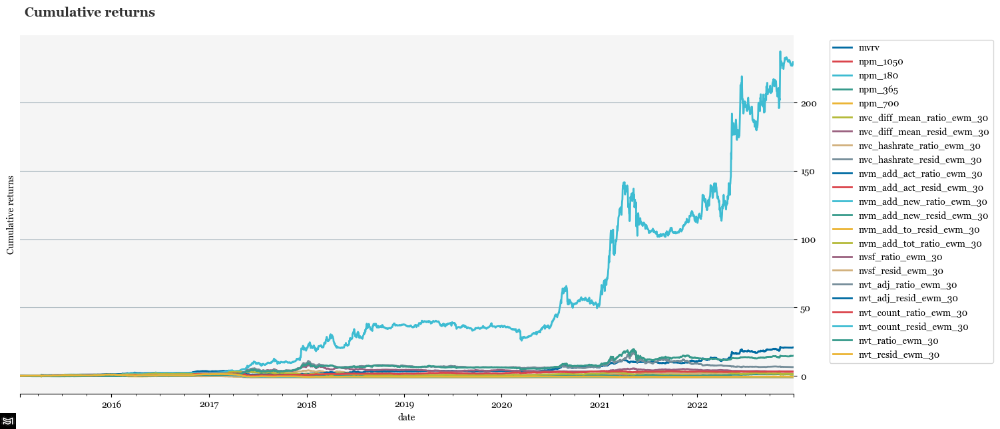

In [67]:
Performance(value_ts_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log', window_type='expanding').plot_metric()

The `Performance` class has a `table` method which computes a wide variety of financial performance metrics and ranks them on a specified metric. We use Sharpe ratio below.

In [68]:
value_ts_perf_table = Performance(value_ts_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log').table(metrics='all', rank_on='Sharpe ratio').iloc[:20]

In [69]:
value_ts_perf_table

,Cumulative return,Annual return,Annual volatility,Skewness,Kurtosis,Max drawdown,VaR,Tail ratio,Sharpe ratio,Sortino ratio,Calmar ratio,Omega ratio,Stability,Annual alpha,Alpha p-val,Beta,Beta p-val
nvm_add_new_ratio_ewm_30,228.19,0.98,0.45,0.18,8.23,-0.35,-0.03,1.23,1.51,2.05,2.78,1.29,0.94,0.90,0.00,0.10,0.00
nvm_add_act_ratio_ewm_30,20.87,0.47,0.38,-1.05,35.97,-0.60,-0.03,1.14,1.02,1.28,0.79,1.19,0.87,0.49,0.00,-0.02,0.01
nvt_ratio_ewm_30,14.77,0.42,0.39,-0.65,18.09,-0.48,-0.03,1.13,0.89,1.05,0.87,1.17,0.84,0.31,0.03,0.19,0.00
nvt_adj_ratio_ewm_30,6.48,0.29,0.42,-0.79,18.27,-0.61,-0.03,1.10,0.61,0.70,0.47,1.12,0.71,0.17,0.20,0.22,0.00
nvt_count_ratio_ewm_30,3.15,0.20,0.33,-1.22,61.42,-0.56,-0.02,1.02,0.54,0.63,0.35,1.10,0.87,0.20,0.13,0.00,0.91
nvsf_ratio_ewm_30,3.26,0.20,0.41,0.63,21.29,-0.55,-0.03,1.14,0.44,0.57,0.36,1.08,0.55,0.11,0.41,0.17,0.00
npm_1050,1.53,0.12,0.46,-1.32,36.38,-0.81,-0.03,1.02,0.25,0.31,0.15,1.04,0.32,0.12,0.50,0.01,0.09
nvc_hashrate_ratio_ewm_30,1.37,0.11,0.48,-1.10,33.28,-0.75,-0.03,1.03,0.23,0.27,0.15,1.04,0.27,-0.01,0.94,0.28,0.00
nvm_add_tot_ratio_ewm_30,1.18,0.10,0.48,-0.71,10.18,-0.78,-0.04,1.02,0.20,0.25,0.13,1.03,0.21,0.01,0.93,0.20,0.00
nvm_add_new_resid_ewm_30,1.07,0.10,0.51,1.07,18.29,-0.71,-0.04,1.04,0.18,0.24,0.13,1.03,0.03,0.15,0.44,-0.11,0.00


In [70]:
value_ts_perf_table.mean()

Cumulative return    13.8005
Annual return         0.0780
Annual volatility     0.4910
Skewness             -0.3935
Kurtosis             28.5065
Max drawdown         -0.7645
VaR                  -0.0345
Tail ratio            1.0155
Sharpe ratio          0.1380
Sortino ratio         0.1740
Calmar ratio          0.2325
Omega ratio           1.0270
Stability             0.5745
Annual alpha          0.0615
Alpha p-val           0.4250
Beta                  0.0215
Beta p-val            0.0505
dtype: float64

#### Cross-Sectional Strategy
Cross-sectional strategies sort assets into quantiles based on their factor values. A long portfolio is formed from the top quantile, and a short portfolio from the bottom quantile.

Strategy parameters are not optimized and are set to:
- `quantiles`: 5
- `tails`: two (use only top and bottom quantiles)
- `rebal_freq`: weekly/7 day portfolio rebalancing
- `t_cost`: 20 bps transaction cost
- `weighting`: equal-weight (ew)

In [71]:
# cs carry returns
value_cs_ret = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).returns(signal_type='signal_quantiles', tails='two', rebal_freq=7, t_cost=0.0025, weighting='ew')

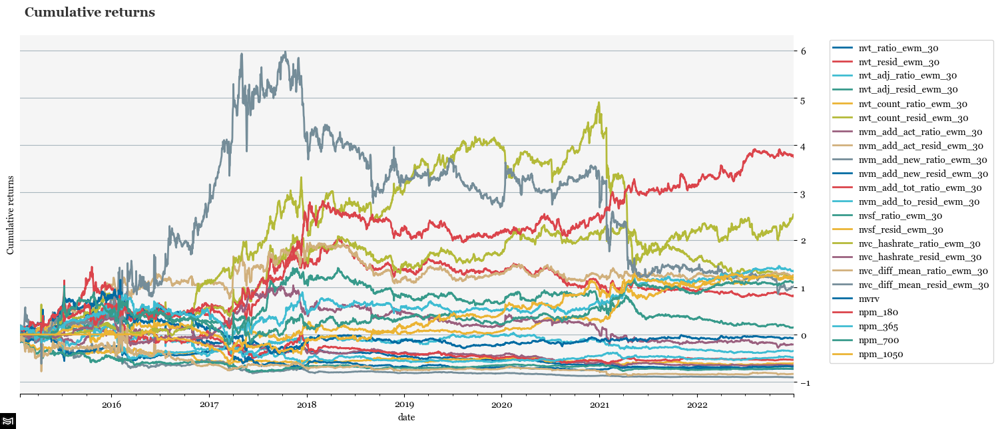

In [72]:
Performance(value_cs_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log', window_type='expanding').plot_metric()

In [73]:
value_cs_perf_table = Performance(value_cs_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log').table(metrics='all', rank_on='Sharpe ratio').iloc[:20]

In [74]:
value_cs_perf_table

,Cumulative return,Annual return,Annual volatility,Skewness,Kurtosis,Max drawdown,VaR,Tail ratio,Sharpe ratio,Sortino ratio,Calmar ratio,Omega ratio,Stability,Annual alpha,Alpha p-val,Beta,Beta p-val
npm_180,3.75,0.22,0.35,-2.22,108.67,-0.38,-0.02,1.18,0.56,0.63,0.57,1.12,0.84,0.21,0.12,0.01,0.02
npm_1050,1.23,0.12,0.26,1.63,29.20,-0.61,-0.02,1.06,0.46,0.63,0.20,1.09,0.74,0.12,0.23,0.00,0.82
nvc_hashrate_ratio_ewm_30,2.52,0.17,0.44,1.87,123.22,-0.60,-0.02,0.93,0.36,0.39,0.29,1.09,0.50,0.23,0.17,-0.11,0.00
npm_365,1.33,0.11,0.30,-0.25,18.45,-0.54,-0.02,1.08,0.36,0.43,0.21,1.07,0.66,0.11,0.33,0.01,0.25
nvsf_resid_ewm_30,1.16,0.10,0.30,0.35,32.03,-0.49,-0.02,1.03,0.32,0.41,0.21,1.06,0.62,0.08,0.48,0.05,0.00
nvm_add_act_resid_ewm_30,1.24,0.11,0.33,-1.22,104.57,-0.32,-0.02,1.10,0.31,0.35,0.33,1.07,0.22,0.09,0.46,0.04,0.00
nvt_count_resid_ewm_30,1.22,0.11,0.35,-1.11,82.59,-0.35,-0.02,1.09,0.28,0.32,0.30,1.06,0.55,0.08,0.53,0.05,0.00
npm_700,1.10,0.10,0.34,-0.77,70.56,-0.61,-0.02,1.00,0.28,0.32,0.16,1.06,0.45,0.10,0.44,0.00,0.65
nvt_resid_ewm_30,0.81,0.08,0.31,-1.54,86.88,-0.41,-0.02,1.09,0.24,0.28,0.19,1.05,0.26,0.06,0.62,0.05,0.00
nvc_diff_mean_resid_ewm_30,1.02,0.09,0.89,-2.01,135.52,-0.76,-0.03,0.99,0.10,0.10,0.12,1.03,0.03,0.09,0.78,0.00,0.90


In [75]:
value_cs_perf_table.mean()

Cumulative return     0.5530
Annual return         0.0195
Annual volatility     0.3905
Skewness             -0.7415
Kurtosis             75.4220
Max drawdown         -0.6135
VaR                  -0.0210
Tail ratio            1.0185
Sharpe ratio          0.0550
Sortino ratio         0.0690
Calmar ratio          0.0750
Omega ratio           1.0125
Stability             0.5075
Annual alpha          0.0105
Alpha p-val           0.4630
Beta                  0.0220
Beta p-val            0.1335
dtype: float64

#### Dual Strategies
Dual strategies (e.g. dual momentum) go long/short assets with factors that are high/low in both the cross section (relative to other assets) and in the time series (relative to the asset's own history). Dual strategies can enhance risk-adjusted returns by combining both time series and cross sectional strategies.

In [76]:
# dual trend returns
value_dual_ret = Factor(value_df, ret_df.tr, strategy='dual_ls', factor_bins=3).returns(signal_type='signal_quantiles', rebal_freq=7, t_cost=0.0025, weighting='ew')

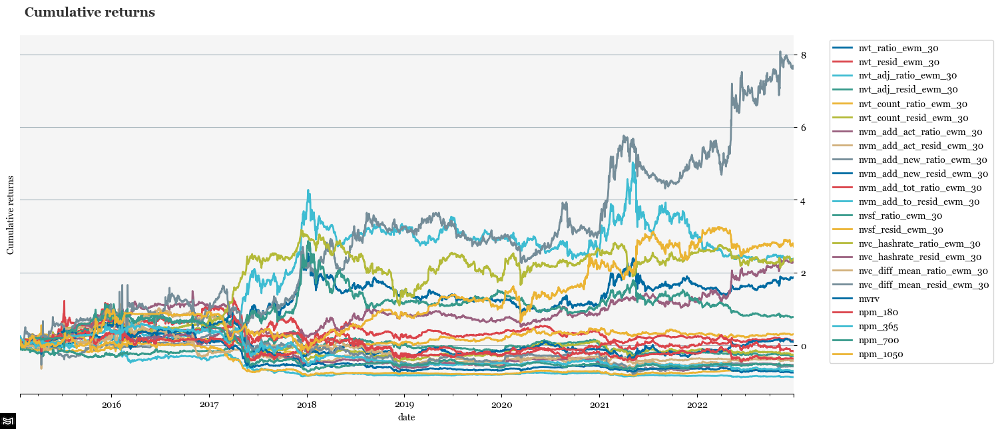

In [77]:
Performance(value_dual_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log', window_type='expanding').plot_metric()

In [78]:
value_dual_perf_table = Performance(value_dual_ret, mkt_ret=mkt_ret_ew.mkt_ret, ret_type='log').table(metrics='all', rank_on='Sharpe ratio')

In [79]:
value_dual_perf_table

,Cumulative return,Annual return,Annual volatility,Skewness,Kurtosis,Max drawdown,VaR,Tail ratio,Sharpe ratio,Sortino ratio,Calmar ratio,Omega ratio,Stability,Annual alpha,Alpha p-val,Beta,Beta p-val
nvm_add_new_ratio_ewm_30,7.61,0.31,0.29,0.20,13.01,-0.41,-0.02,1.08,0.93,1.23,0.77,1.16,0.89,0.29,0.01,0.04,0.00
nvc_hashrate_ratio_ewm_30,2.33,0.16,0.25,-0.45,13.78,-0.50,-0.02,1.05,0.61,0.77,0.33,1.11,0.61,0.12,0.17,0.09,0.00
npm_1050,2.71,0.18,0.35,-0.83,20.03,-0.58,-0.02,1.13,0.47,0.56,0.31,1.09,0.77,0.17,0.21,0.03,0.00
nvm_add_act_ratio_ewm_30,2.29,0.16,0.33,-0.86,95.02,-0.51,-0.02,1.07,0.46,0.55,0.32,1.09,0.50,0.17,0.19,-0.01,0.20
nvt_adj_ratio_ewm_30,2.38,0.17,0.34,-0.21,20.58,-0.45,-0.02,0.98,0.45,0.52,0.36,1.08,0.64,0.09,0.40,0.14,0.00
nvt_ratio_ewm_30,1.87,0.14,0.34,0.73,35.60,-0.47,-0.02,0.98,0.39,0.48,0.30,1.08,0.66,0.08,0.48,0.13,0.00
nvsf_ratio_ewm_30,0.77,0.07,0.36,1.83,89.69,-0.54,-0.02,0.98,0.20,0.24,0.14,1.04,0.52,0.01,0.94,0.15,0.00
nvt_count_ratio_ewm_30,0.31,0.03,0.27,-2.35,141.62,-0.48,-0.02,0.94,0.12,0.14,0.07,1.02,0.52,0.03,0.77,0.01,0.02
nvt_resid_ewm_30,0.12,0.01,0.36,-1.07,51.18,-0.63,-0.02,1.08,0.04,0.05,0.02,1.01,0.36,0.04,0.75,-0.06,0.00
nvm_add_new_resid_ewm_30,0.08,0.01,0.35,0.43,9.88,-0.73,-0.03,0.99,0.03,0.04,0.01,1.00,0.19,0.03,0.80,-0.05,0.00


In [80]:
value_dual_perf_table.mean()

Cumulative return     0.597826
Annual return        -0.001304
Annual volatility     0.390000
Skewness             -0.604348
Kurtosis             54.967826
Max drawdown         -0.686957
VaR                  -0.026087
Tail ratio            0.989130
Sharpe ratio          0.013478
Sortino ratio         0.014783
Calmar ratio          0.047826
Omega ratio           1.004783
Stability             0.593043
Annual alpha         -0.004783
Alpha p-val           0.523043
Beta                  0.005217
Beta p-val            0.009565
dtype: float64

## Factor Quantile Returns
Factor quantile returns provide a measure of alpha factor performance. 

The ```Factor``` class has a ```quantiles``` method to analyze returns across bins/quantiles in order to assess the robustness of the alpha factor. Returns which increase monotonically with quantiles are likely to be more reliable that those with positive but non-monotonic relationships.

- The `factor` parameter in the quantile method allows us to select the factor for which to create quantiles. 
- The `metric` parameter allows us to compute a specific metrics from the ```Performance``` class. Here we use the default 'ret' value for returns.
- The ```rebal_freq``` parameter allows us to modify the rebalancing frequency for the strategy. This value defaults to 1, meaning changing with each period/frequency. We select '7' for weekly rebalancing with daily data frequency.

#### Time Series

In [81]:
value_ts_quantile_ret = Factor(value_df, ret_df.tr, strategy='ts_ls', factor_bins=3).quantiles(factor=value_ts_perf_table.iloc[0].name, metric='ret', rebal_freq=7)

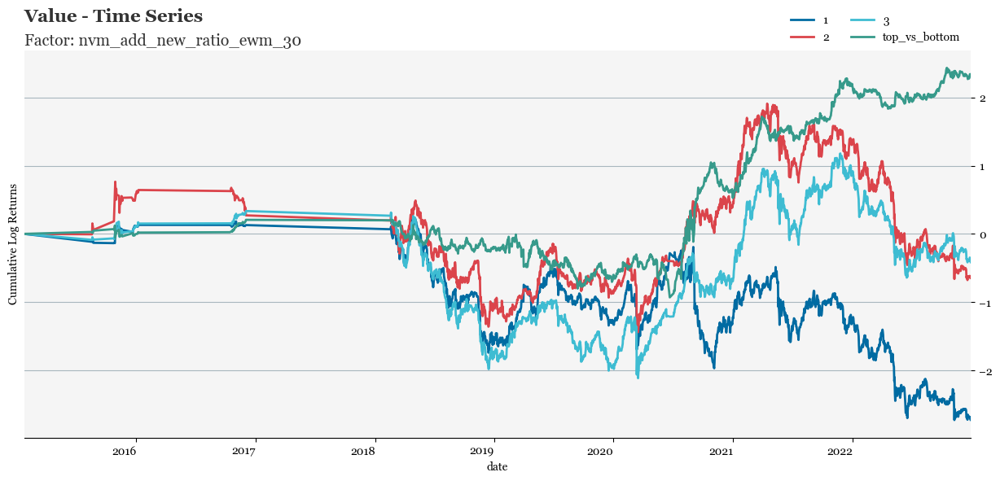

In [82]:
plot_series(value_ts_quantile_ret.cumsum(),
            title="Value - Time Series",
            subtitle=f"Factor: {value_ts_perf_table.iloc[0].name}",
            y_label='Cumulative Log Returns'
           )

In [83]:
value_ts_quantile_ann_ret = Factor(value_df, ret_df.tr, strategy='ts_ls', factor_bins=3).quantiles(factor=value_ts_perf_table.iloc[0].name, metric='ann_ret')

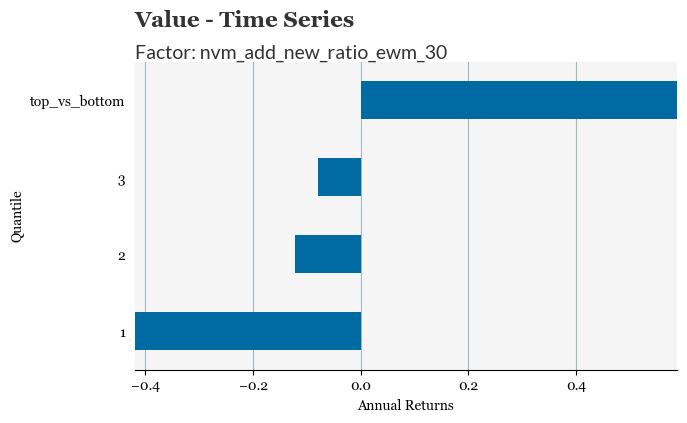

In [84]:
plot_bar(value_ts_quantile_ann_ret,
         axis='horizontal',
         title="Value - Time Series",
         subtitle=f"Factor: {value_ts_perf_table.iloc[0].name}",
         y_label='Quantile',
         x_label='Annual Returns'
         )

In [85]:
value_ts_quantile_vol = Factor(value_df, ret_df.tr, strategy='ts_ls', factor_bins=3).quantiles(factor=value_ts_perf_table.iloc[0].name, metric='ann_vol')

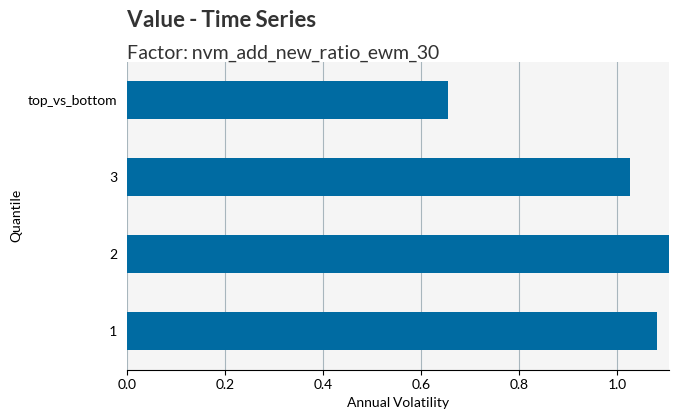

In [86]:
plot_bar(value_ts_quantile_vol,
         axis='horizontal',
         title="Value - Time Series",
         subtitle=f"Factor: {value_ts_perf_table.iloc[0].name}",
         y_label='Quantile',
         x_label='Annual Volatility'
         )

In [87]:
value_ts_quantile_sr = Factor(value_df, ret_df.tr, strategy='ts_ls', factor_bins=3).quantiles(factor=value_ts_perf_table.iloc[0].name, metric='sharpe_ratio')

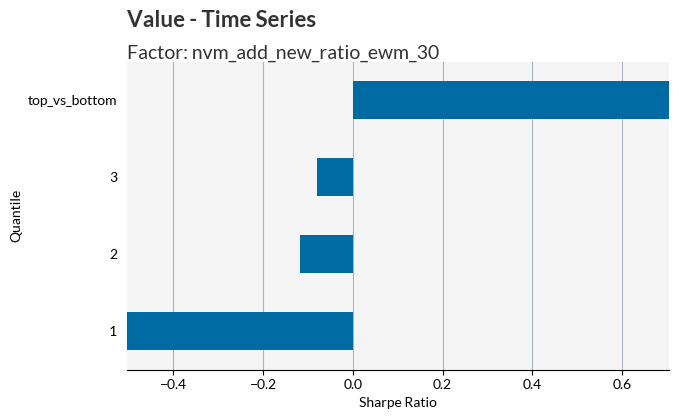

In [88]:
plot_bar(value_ts_quantile_sr,
         axis='horizontal',
         title="Value - Time Series",
         subtitle=f"Factor: {value_ts_perf_table.iloc[0].name}",
         y_label='Quantile',
         x_label='Sharpe Ratio'
         )

#### Cross-sectional Strategy

In [89]:
value_cs_quantile_ret = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).quantiles(factor=value_cs_perf_table.iloc[0].name, metric='ret')

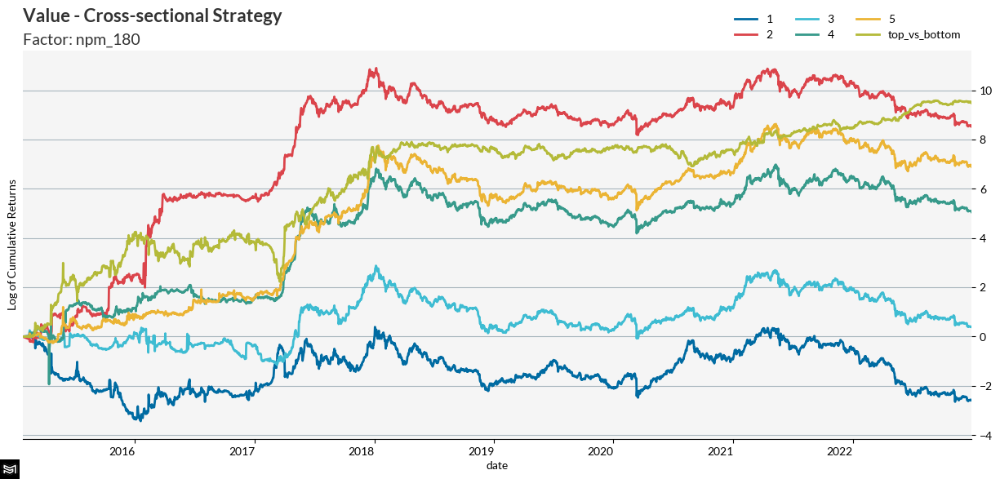

In [90]:
plot_series(value_cs_quantile_ret.cumsum(),
            title="Value - Cross-sectional Strategy",
            subtitle=f"Factor: {value_cs_perf_table.iloc[0].name}",
            y_label='Log of Cumulative Returns',
            add_logo=True
           )

In [91]:
value_cs_quantile_ann_ret = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).quantiles(factor=value_cs_perf_table.iloc[0].name, metric='ann_ret')

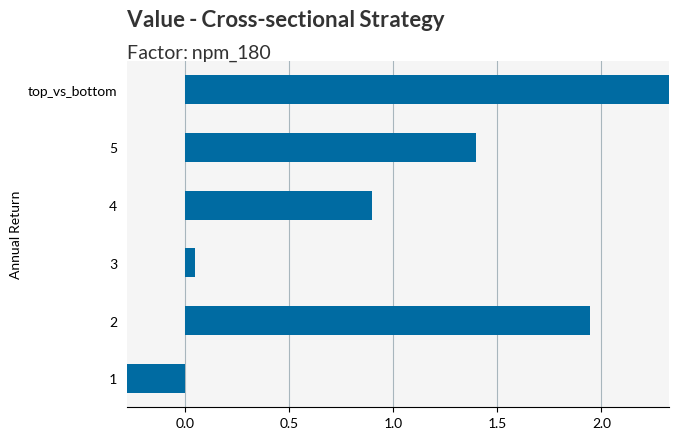

In [92]:
plot_bar(value_cs_quantile_ann_ret,
         axis='horizontal',
         title="Value - Cross-sectional Strategy",
         subtitle=f"Factor: {value_cs_perf_table.iloc[0].name}",
         y_label='Annual Return'
        )

In [93]:
value_cs_quantile_ann_vol = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).quantiles(factor=value_cs_perf_table.iloc[0].name, metric='ann_vol')

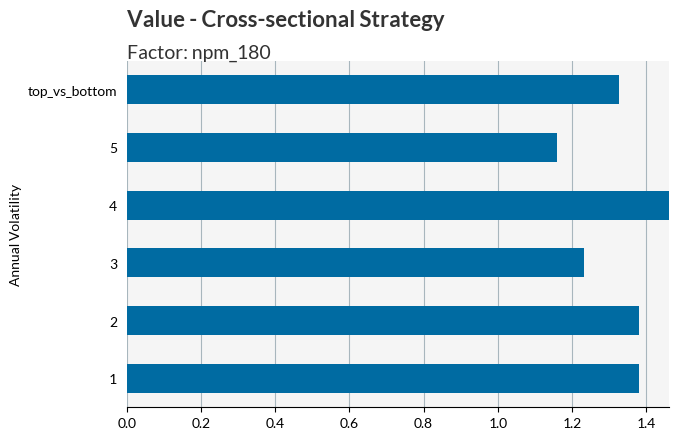

In [94]:
plot_bar(value_cs_quantile_ann_vol,
         axis='horizontal',
         title="Value - Cross-sectional Strategy",
         subtitle=f"Factor: {value_cs_perf_table.iloc[0].name}",
         y_label='Annual Volatility'
        )

In [95]:
value_cs_quantile_sr = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).quantiles(factor=value_cs_perf_table.iloc[0].name, metric='sharpe_ratio')

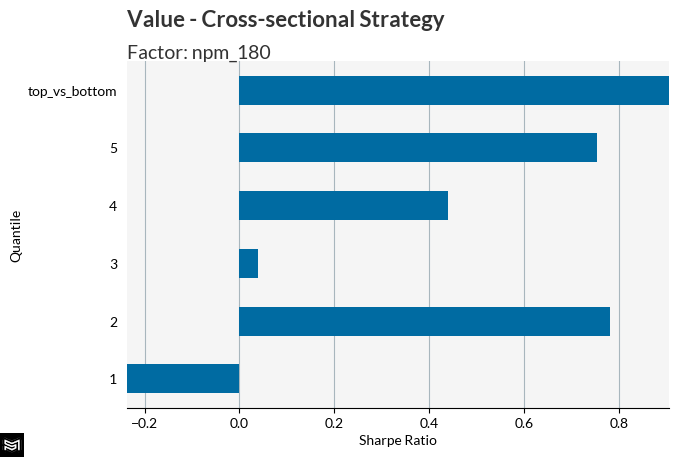

In [96]:
plot_bar(value_cs_quantile_sr,
         axis='horizontal',
         title="Value - Cross-sectional Strategy",
         subtitle=f"Factor: {value_cs_perf_table.iloc[0].name}",
         y_label='Quantile',
         x_label='Sharpe Ratio',
         add_logo=True
         )

#### Dual Strategy

In [97]:
value_dual_quantile_ret = Factor(value_df, ret_df.tr, strategy='dual_ls', factor_bins=5).quantiles(factor=value_dual_perf_table.iloc[0].name, metric='ret')

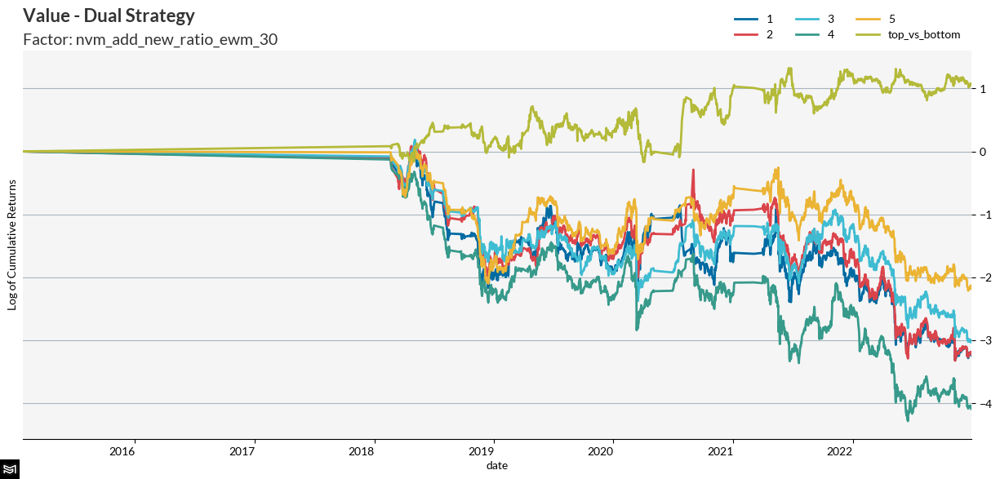

In [98]:
plot_series(value_dual_quantile_ret.cumsum(),
            title="Value - Dual Strategy",
            subtitle=f"Factor: {value_dual_perf_table.iloc[0].name}",
            y_label='Log of Cumulative Returns',
            add_logo=True
           )

In [99]:
value_dual_quantile_ann_ret = Factor(value_df, ret_df.tr, strategy='dual_ls', factor_bins=5).quantiles(factor=value_dual_perf_table.iloc[0].name, metric='ann_ret')

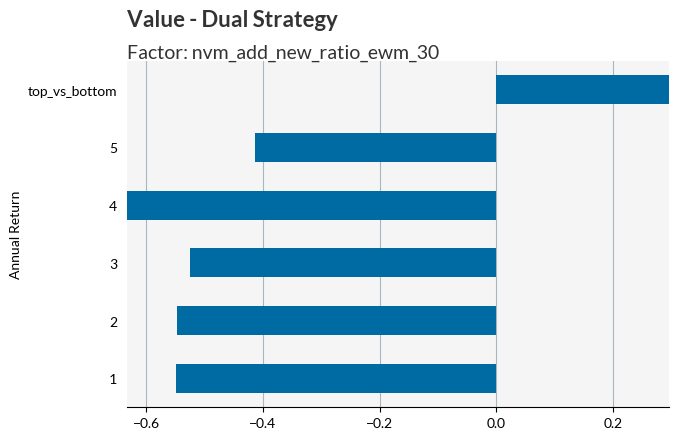

In [100]:
plot_bar(value_dual_quantile_ann_ret,
         axis='horizontal',
         title="Value - Dual Strategy",
         subtitle=f"Factor: {value_dual_perf_table.iloc[0].name}",
         y_label='Annual Return'
        )

In [101]:
value_dual_quantile_ann_vol = Factor(value_df, ret_df.tr, strategy='dual_ls', factor_bins=5).quantiles(factor=value_dual_perf_table.iloc[0].name, metric='ann_vol')

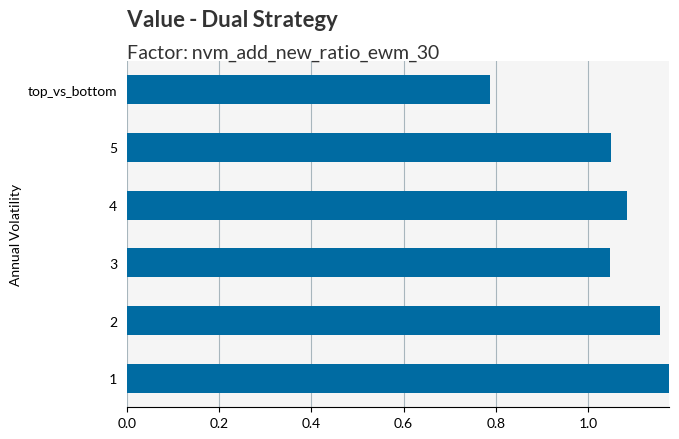

In [102]:
plot_bar(value_dual_quantile_ann_vol,
         axis='horizontal',
         title="Value - Dual Strategy",
         subtitle=f"Factor: {value_dual_perf_table.iloc[0].name}",
         y_label='Annual Volatility'
        )

In [103]:
value_dual_quantile_sr = Factor(value_df, ret_df.tr, strategy='dual_ls', factor_bins=5).quantiles(factor=value_dual_perf_table.iloc[0].name, metric='sharpe_ratio')

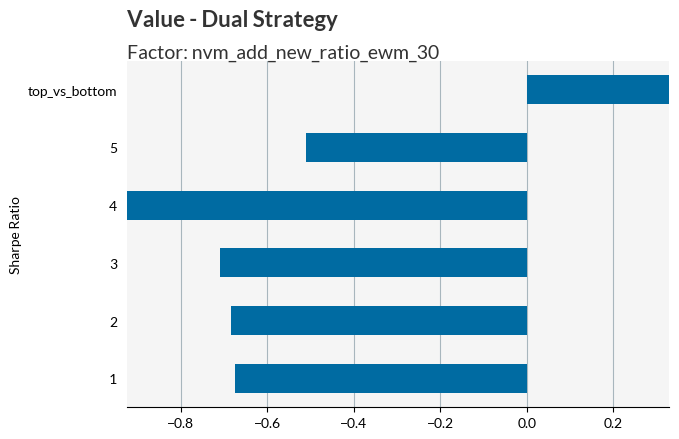

In [104]:
plot_bar(value_dual_quantile_sr,
         axis='horizontal',
         title="Value - Dual Strategy",
         subtitle=f"Factor: {value_dual_perf_table.iloc[0].name}",
         y_label='Sharpe Ratio'
        )

## Parameter Grid Search

Rather than pick an arbitrary parameter value as most academic studies do, **FactorLab** has a `factor_param_grid_search` function allows us to explore the parameter space.

A robust value factor should be insensitive to changes in inputs and small changes in parameter values. A factor which produces positive returns only across a narrow set of parameter values is more likely to be spurious.

In [105]:
# parameter grid search
nvm_ts_param_df = factor_param_grid_search(oc_df, ret_df.tr, Value, 'nvm',
                                           
                         feat_args = {
                             'log': [True, False],
                             'smoothing': [None, 'smw','ewm','median'],
                             'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120],
                             'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_new', 'add_act', 'add_tot'],
                                 },
                     factor_args = {'strategy': 'ts_ls'},
                     ret_args = {'signal_type': 'signal', 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


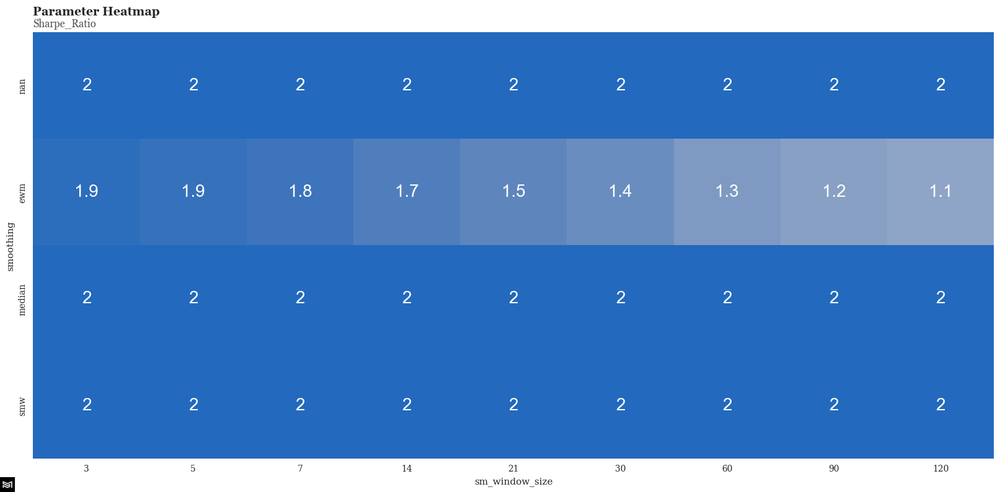

In [106]:
param_heatmap(nvm_ts_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


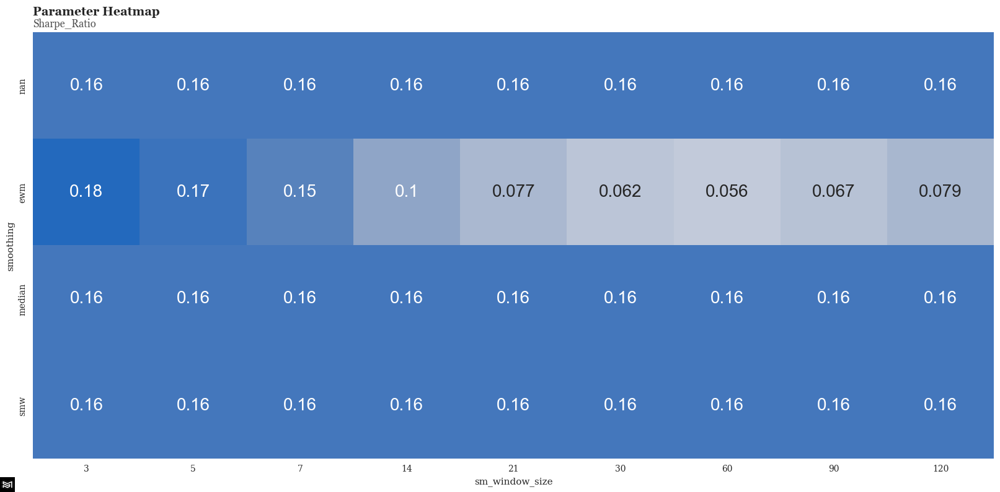

In [107]:
param_heatmap(nvm_ts_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'resid', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


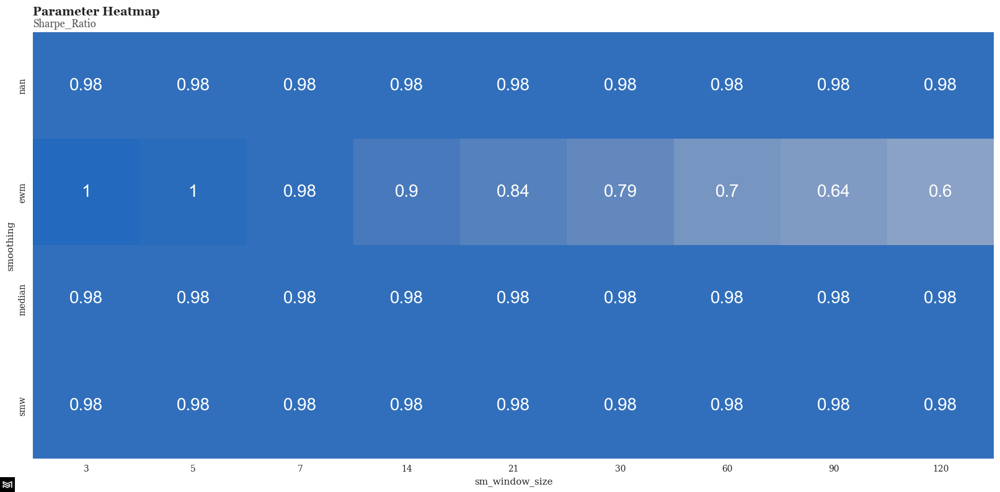

In [108]:
param_heatmap(nvm_ts_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_act'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


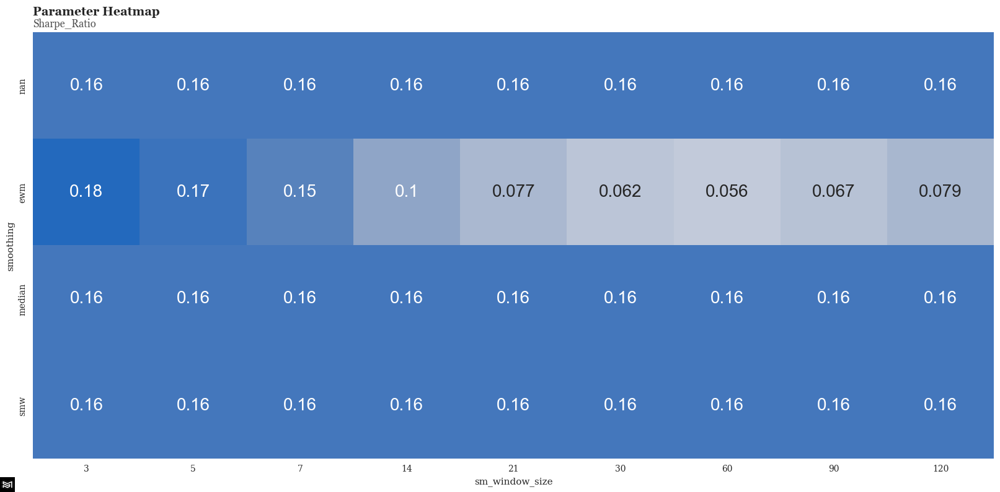

In [109]:
param_heatmap(nvm_ts_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'resid', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

In [110]:
nvm_ts_param_h1_df = factor_param_grid_search(oc_df.loc['2016-01-01':'2019-12-31'], ret_df.tr, Value, 'nvm',
                                feat_args = {
                                    'log': [True, False],
                                  'smoothing': ['smw','ewm','median'],
                                   'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120, 180, 365],
                                    'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_act', 'add_new'],
                                 },
                     factor_args = {'strategy': 'ts_ls'},
                     ret_args = {'signal_type': 'signal', 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

In [111]:
nvm_ts_param_h2_df = factor_param_grid_search(oc_df.loc['2020-01-01':], ret_df.tr, Value, 'nvm',
                                feat_args = {
                                    'log': [True, False],
                                  'smoothing': ['smw','ewm','median'],
                                   'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120, 180, 365],
                                    'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_act', 'add_new'],
                                 },
                     factor_args = {'strategy': 'ts_ls'},
                     ret_args = {'signal_type': 'signal', 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


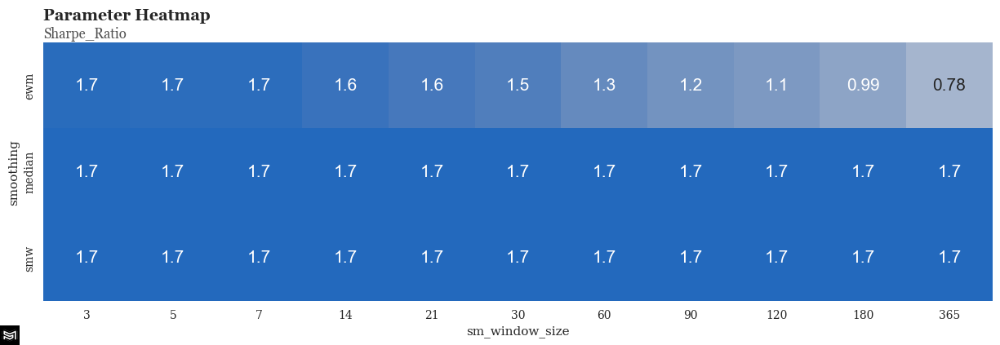

In [112]:
param_heatmap(nvm_ts_param_h1_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


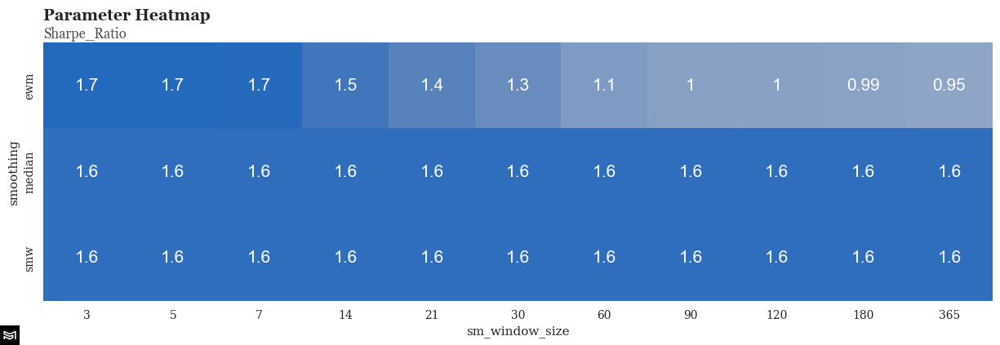

In [113]:
param_heatmap(nvm_ts_param_h2_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

In [114]:
# parameter grid search
nvm_cs_param_df = factor_param_grid_search(oc_df, ret_df.tr, Value, 'nvm',
                                           
                         feat_args = {
                             'log': [True, False],
                             'smoothing': [None, 'smw','ewm','median'],
                             'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120],
                             'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_new', 'add_act', 'add_tot'],
                                 },
                     factor_args = {'strategy': 'cs_ls'},
                     ret_args = {'signal_type': 'signal_quantiles', 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog


/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


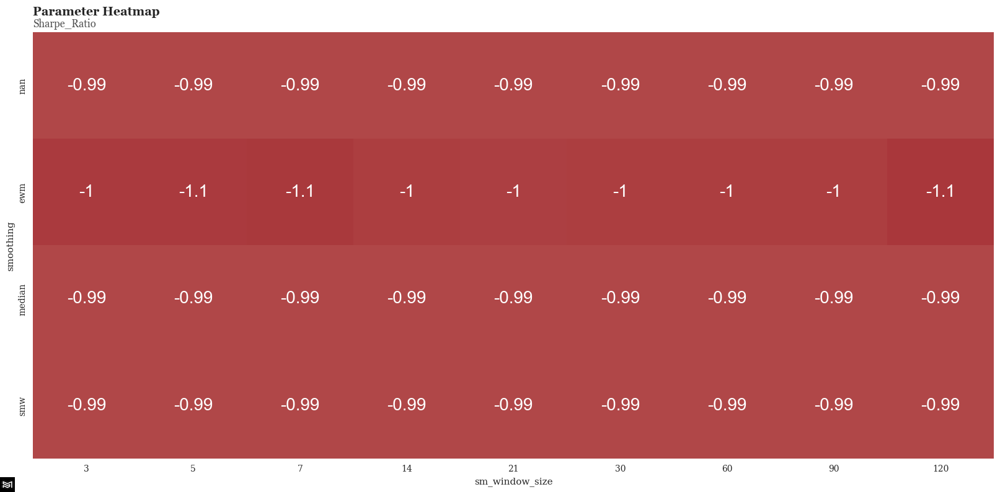

In [115]:
param_heatmap(nvm_cs_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


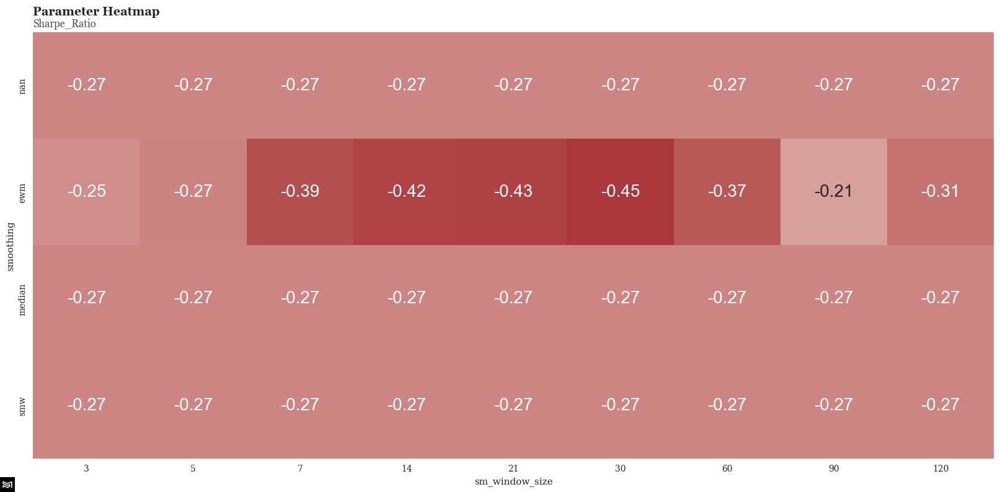

In [116]:
param_heatmap(nvm_cs_param_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'resid', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

In [117]:
nvm_cs_param_h1_df = factor_param_grid_search(oc_df.loc['2016-01-01':'2019-12-31'], ret_df.tr, Value, 'nvm',
                                feat_args = {
                                    'log': [True, False],
                                  'smoothing': ['smw','ewm','median'],
                                   'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120, 180, 365],
                                    'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_act', 'add_new'],
                                 },
                     factor_args = {'strategy': 'cs_ls', 'factor_bins': 5},
                     ret_args = {'signal_type': 'signal_quantiles', 'tails': 'two', 'ts_norm': True, 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

In [118]:
nvm_cs_param_h2_df = factor_param_grid_search(oc_df.loc['2020-01-01':], ret_df.tr, Value, 'nvm',
                                feat_args = {
                                    'log': [True, False],
                                  'smoothing': ['smw','ewm','median'],
                                   'sm_window_size': [3, 5, 7, 14, 21, 30, 60, 90, 120, 180, 365],
                                    'method': ['ratio', 'resid']
                                },
                     algo_args = { 'value_metric': ['add_act', 'add_new'],
                                 },
                     factor_args = {'strategy': 'cs_ls', 'factor_bins': 5},
                     ret_args = {'signal_type': 'signal_quantiles', 'tails': 'two', 'ts_norm': True, 'rebal_freq': 7, 't_cost': 0.002, 'weighting': 'ew'}
                               )

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/statespace/kalman_filter.py:1768: RuntimeWarning: invalid value encountered in double_scalars
  self.scale = np.sum(scale_obs[d:]) / nobs_k_endog
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/statsmodels/tsa/base/tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
/Users/nickl/opt/anaconda3/envs/factorlab/lib/python3.9/site-packages/st

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


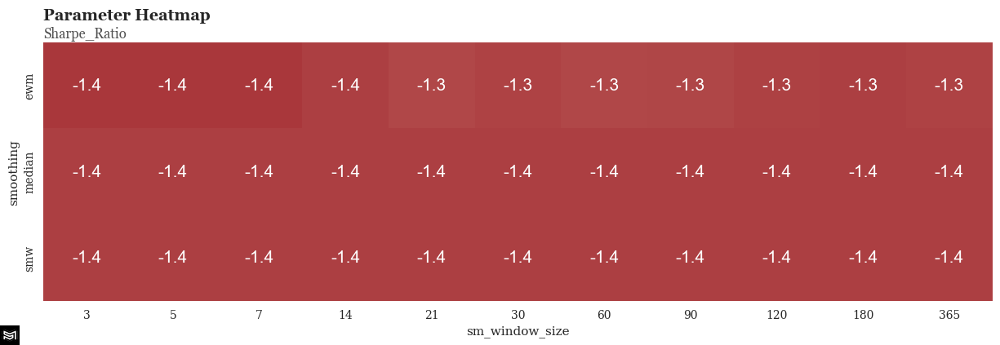

In [119]:
param_heatmap(nvm_cs_param_h1_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

/Users/nickl/projects/systamental/factorlab/src/factorlab/feature_analysis/param_grid_search.py:383: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  param_matrix = param_df.pivot(*tuple(plot_params))


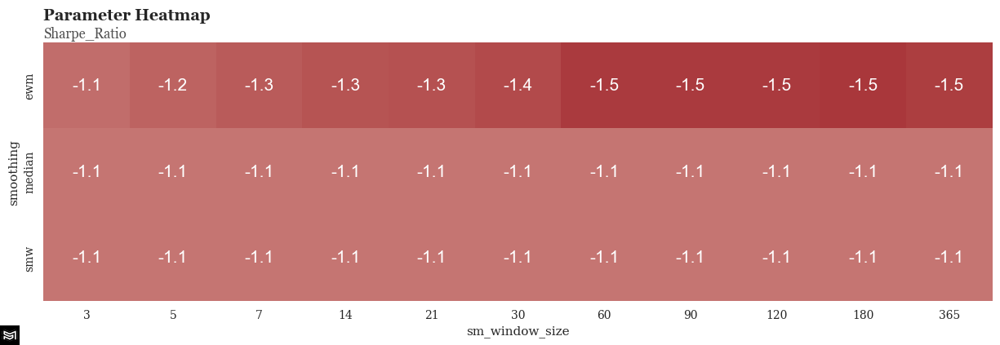

In [120]:
param_heatmap(nvm_cs_param_h2_df, metric='sharpe_ratio', fixed_params={'log': True, 'method': 'ratio', 'value_metric': 'add_new'}, plot_params=['smoothing', 'sm_window_size'])

### T-cost Analysis

Assessing the investability of a factor involves making sure that returns are positive after transaction costs. We can estimate the breakeven transaction cost for any factor using the `tcosts_be` method.

An investable value factor should produce positive returns after transaction costs with enough of a margin should t-costs increase.

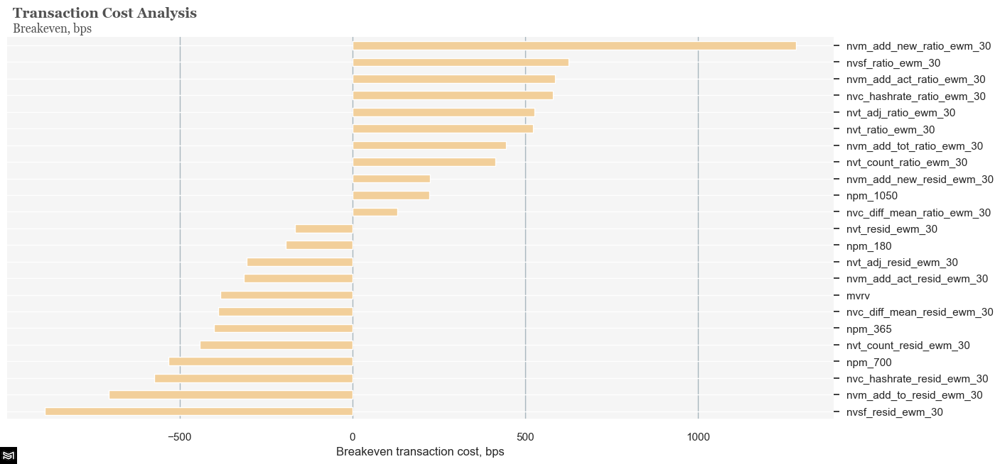

In [121]:
be_ts_tcosts = Factor(value_df, ret_df.tr, strategy='ts_ls', factor_bins=5).tcosts_be(signal_type='signal', rebal_freq=7, weighting='ew', plot_tcosts=True)

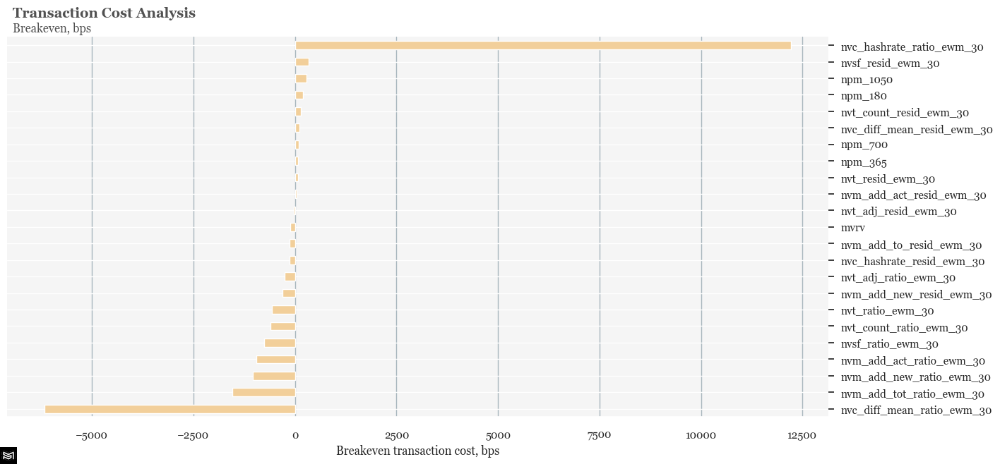

In [122]:
be_cs_tcosts = Factor(value_df, ret_df.tr, strategy='cs_ls', factor_bins=5).tcosts_be(signal_type='signal_quantiles', ts_norm=True, tails='two', rebal_freq=7, weighting='ew', plot_tcosts=True)

# Value Everywhere

We can compare the cryptoasset value factor returns to those of individual equities (US, UK, EU, JP), global equity indexes, FX, global fixed-income and commodity value factors using AQR's Value & Momentum Everywhere returns:
<br>
https://www.aqr.com/Insights/Datasets/Value-and-Momentum-Everywhere-Factors-Monthly

In [123]:
aqr_df = pd.read_excel('https://www.aqr.com/-/media/AQR/Documents/Insights/Data-Sets/Value-and-Momentum-Everywhere-Portfolios-Monthly.xlsx', sheet_name='VME Portfolios', header=20, index_col=0, parse_dates=True)
aqr_df.index.name = 'date'

In [124]:
# create L/S value portfolios
aqr_df['US_Eqty_Value_LS'] = aqr_df.loc[:,'VAL3US'] - aqr_df.loc[:,'VAL1US']
aqr_df['UK_Eqty_Value_LS'] = aqr_df.loc[:,'VAL3UK'] - aqr_df.loc[:,'VAL1UK']
aqr_df['EU_Eqty_Value_LS'] = aqr_df.loc[:,'VAL3EU'] - aqr_df.loc[:,'VAL1EU']
aqr_df['JP_Eqty_Value_LS'] = aqr_df.loc[:,'VAL3JP'] - aqr_df.loc[:,'VAL1JP']
aqr_df['EQ_Value_LS'] = aqr_df.loc[:,'VAL3_VME_EQ'] - aqr_df.loc[:,'VAL1_VME_EQ']
aqr_df['FX_Value_LS'] = aqr_df.loc[:,'VAL3_VME_FX'] - aqr_df.loc[:,'VAL1_VME_FX']
aqr_df['FI_Value_LS'] = aqr_df.loc[:,'VAL3_VME_FI'] - aqr_df.loc[:,'VAL1_VME_FI']
aqr_df['COM_Value_LS'] = aqr_df.loc[:,'VAL3_VME_COM'] - aqr_df.loc[:,'VAL1_VME_COM']

In [125]:
value_df.columns

Index(['nvt_ratio_ewm_30', 'nvt_resid_ewm_30', 'nvt_adj_ratio_ewm_30',
       'nvt_adj_resid_ewm_30', 'nvt_count_ratio_ewm_30',
       'nvt_count_resid_ewm_30', 'nvm_add_act_ratio_ewm_30',
       'nvm_add_act_resid_ewm_30', 'nvm_add_new_ratio_ewm_30',
       'nvm_add_new_resid_ewm_30', 'nvm_add_tot_ratio_ewm_30',
       'nvm_add_to_resid_ewm_30', 'nvsf_ratio_ewm_30', 'nvsf_resid_ewm_30',
       'nvc_hashrate_ratio_ewm_30', 'nvc_hashrate_resid_ewm_30',
       'nvc_diff_mean_ratio_ewm_30', 'nvc_diff_mean_resid_ewm_30', 'mvrv',
       'npm_180', 'npm_365', 'npm_700', 'npm_1050'],
      dtype='object')

In [126]:
# add crypto value factor
aqr_df['Crypto_Value_TS_LS'] = value_ts_ret[['nvt_ratio_ewm_30', 'nvt_adj_ratio_ewm_30', 'nvt_count_ratio_ewm_30',
       'nvm_add_act_ratio_ewm_30', 'nvm_add_new_ratio_ewm_30']].mean(axis=1).resample('M').sum()
aqr_df['Crypto_Value_CS_LS'] = value_cs_ret[['nvt_ratio_ewm_30', 'nvt_adj_ratio_ewm_30', 'nvt_count_ratio_ewm_30',
       'nvm_add_act_ratio_ewm_30', 'nvm_add_new_ratio_ewm_30']].mean(axis=1).resample('M').sum()
aqr_df['mkt_ret'] = mkt_ret_mw.resample('M').sum()

In [127]:
# target vol
aqr_norm_df = Transform(aqr_df).target_vol(ann_vol=0.1, ann_factor=12)

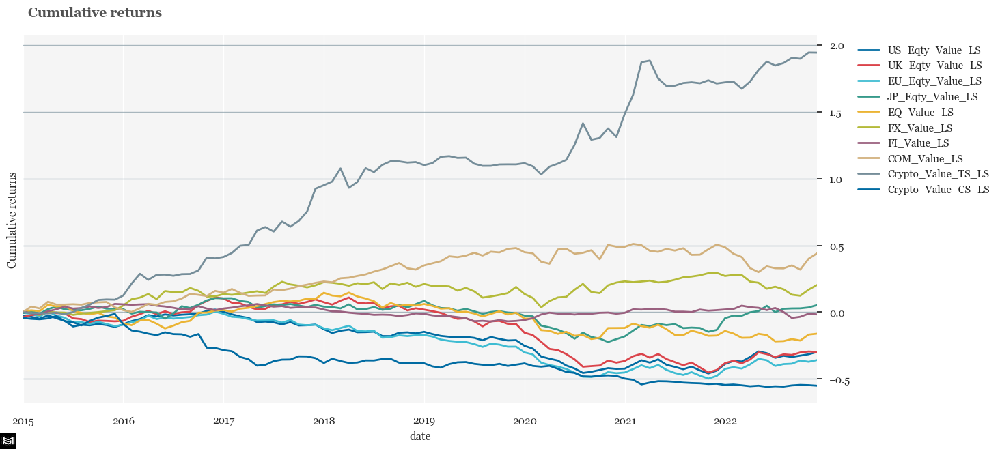

In [128]:
Performance(aqr_norm_df.loc[:,'US_Eqty_Value_LS':'Crypto_Value_CS_LS'].dropna(), mkt_ret=aqr_df.mkt_ret, ret_type='log', window_type='expanding').plot_metric()

In [129]:
value_table = Performance(aqr_norm_df.loc[:,'US_Eqty_Value_LS':'Crypto_Value_CS_LS'], mkt_ret=aqr_norm_df.mkt_ret, ann_factor=12).table(rank_on='Sharpe ratio', metrics='key_metrics')

In [130]:
value_table

,Cumulative return,Annual return,Annual volatility,Sharpe ratio,Max drawdown
Crypto_Value_TS_LS,1.81,0.14,0.1,1.35,-0.07
JP_Eqty_Value_LS,5.58,0.05,0.1,0.49,-0.49
EQ_Value_LS,2.10,0.02,0.1,0.30,-0.53
FX_Value_LS,1.76,0.02,0.1,0.28,-0.28
COM_Value_LS,2.17,0.02,0.1,0.27,-0.43
UK_Eqty_Value_LS,0.61,0.01,0.1,0.16,-0.60
US_Eqty_Value_LS,0.76,0.01,0.1,0.16,-0.53
FI_Value_LS,0.49,0.01,0.1,0.15,-0.39
EU_Eqty_Value_LS,0.44,0.01,0.1,0.14,-0.66
Crypto_Value_CS_LS,-0.57,-0.10,0.1,-1.00,-0.57


In [131]:
corr_df = aqr_df.loc[:,'US_Eqty_Value_LS':].corr()

/var/folders/5b/_nz5t_ys2yd4hc70pc_p07g80000gn/T/ipykernel_91915/452521645.py:3: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn')


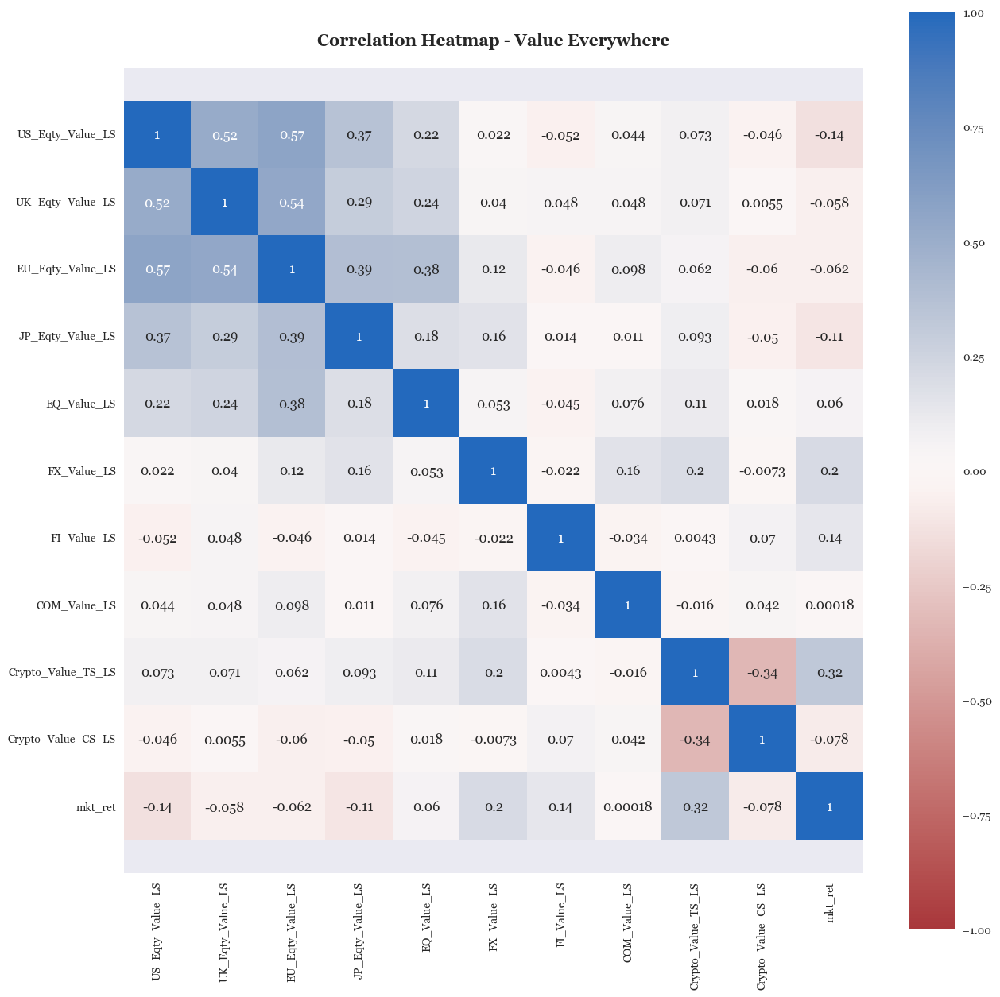

In [132]:
# create correlation heatmap
# set plot style, font and colors
plt.style.use('seaborn')
plt.rcParams['font.family'] = 'georgia'
fig = plt.figure(figsize=(15,15))
sns.despine(left=True)

heatmap = sns.heatmap(corr_df, cmap="vlag_r", annot=True, vmin=-1, vmax=1, xticklabels=corr_df.columns, yticklabels=corr_df.columns, square=True)
heatmap.set_title('Correlation Heatmap - Value Everywhere', fontdict={'fontsize':15}, pad=20, weight='bold')
bottom, top = heatmap.get_ylim()
heatmap.set_ylim(bottom + 0.5, top - 0.5);

# Market Valuation

In [133]:
# market ret and NVM ratio
mkt_value_df = value_z_df[['nvm_add_new_ratio_ewm_30']].mean(axis=1).groupby('date').mean().to_frame('NVM_ratio')
mkt_value_df = pd.concat([mkt_value_df, mkt_ret_mw.cumsum()], axis=1).replace(0, np.nan).dropna()

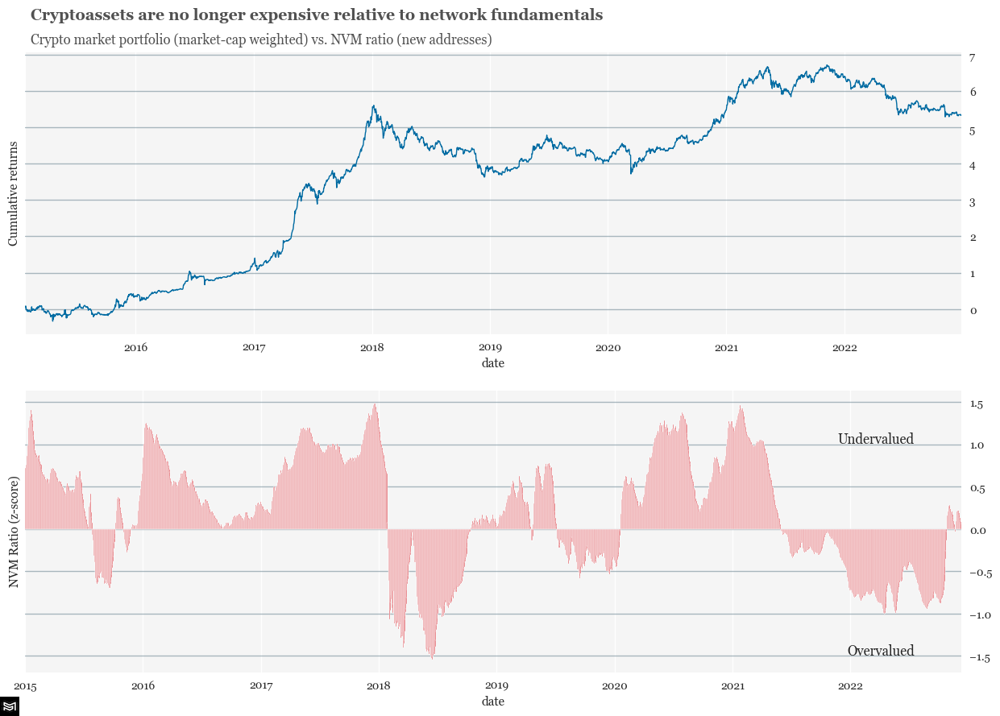

In [134]:
# plot market ret and NVM ratio
fig, axes = plt.subplots(nrows=2, figsize=(15,10))

mkt_value_df['mkt_ret'].plot(
    linewidth=1,
    color='#006BA2',
    ax=axes[0])

mkt_value_df['NVM_ratio'].plot(
    kind='bar', 
    ax=axes[1], 
    width=2,
    color='#DB444B')

# font
plt.rcParams['font.family'] = 'georgia'

# grid
for i in range(0,2):
    axes[i].grid(which="major", axis='y', color='#758D99', alpha=0.6, zorder=1)
    axes[i].set_facecolor("whitesmoke")
    axes[i].spines[['top', 'right', 'left']].set_visible(False)
    
# Reformat y-axis tick labels
axes[0].set_ylabel('Cumulative returns')
axes[0].yaxis.tick_right()
axes[1].set_ylabel('NVM Ratio (z-score)')
axes[1].yaxis.tick_right()

# add systamental logo
img = Image.open('../src/factorlab/systamental_logo.png')
plt.figimage(img, origin='upper')

# Add in title and subtitle
axes[0].text(x=0.13, y=.92, s=f"Cryptoassets are no longer expensive relative to network fundamentals", transform=fig.transFigure, ha='left', fontsize=14,
        weight='bold', alpha=.8, fontdict=None)

sub_title = f"Crypto market portfolio (market-cap weighted) vs. NVM ratio (new addresses)"
axes[0].text(x=0.13, y=.89, s=sub_title, transform=fig.transFigure, ha='left', fontsize=12, alpha=.8,
        fontdict=None);

# show every Nth label
locs, labels = plt.xticks()
N = 365
plt.xticks(locs[::N], mkt_value_df.index[::N].strftime('%Y'), rotation=0)

# add over/undervaluation text
axes[1].text(0.95, .8, 'Undervalued', horizontalalignment='right', verticalalignment='bottom', transform=axes[1].transAxes)
axes[1].text(0.95, .05, 'Overvalued', horizontalalignment='right', verticalalignment='bottom', transform=axes[1].transAxes);

In [135]:
# market value comp
value_comp_z_df = value_z_df[['nvm_add_new_ratio_ewm_30']].mean(axis=1)
mkt_value_comp_z_df = value_comp_z_df.groupby('date').mean().to_frame('NVM_ratio')
mkt_value_comp_z_df['ticker'] = 'crypto_mkt'
mkt_value_comp_z_df = mkt_value_comp_z_df.reset_index().set_index(['date', 'ticker'])

In [136]:
# fwd mkt rets
fwd_mkt_ret = fwd_spot_ret.groupby('date').mean()
fwd_mkt_ret['ticker'] = 'crypto_mkt'
fwd_mkt_ret = fwd_mkt_ret.reset_index().set_index(['date', 'ticker'])

# Valuation Dashboard

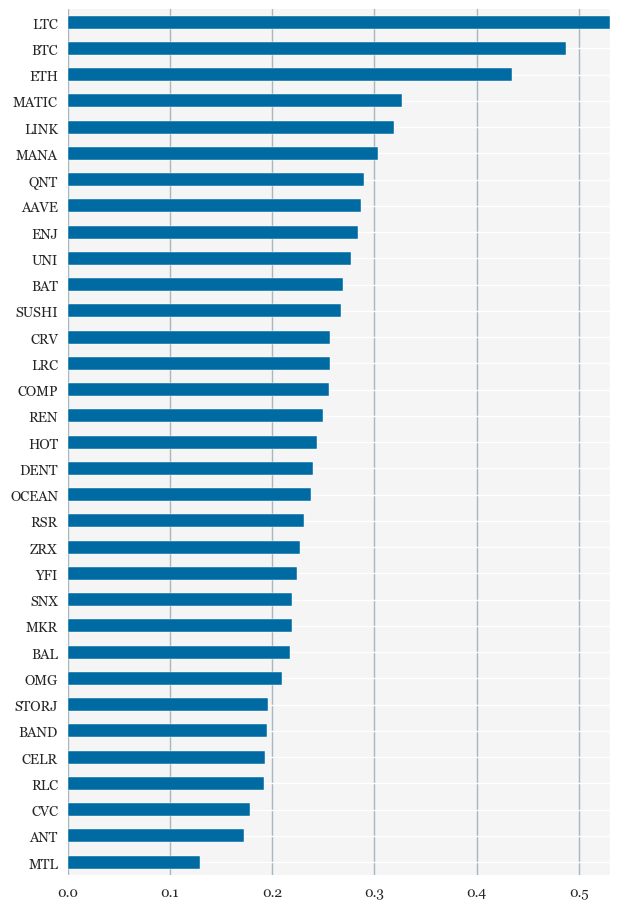

In [137]:
plot_bar(value_df['nvm_add_new_ratio_ewm_30'].unstack().iloc[-1].dropna().sort_values(),
         axis='horizontal'
        )